# Bias-Aware Clustering
In this notebook, we experiment with the Bias-Aware Clustering algorithm to identify which of the clustering algorithms (K-Means, DBSCAN or MeanShift) perform best in identifying discriminated clusters. The experiment is conducted with the German Credit Risk dataset.

To obtain the appropriate input for the Bias-Aware Clustering algorithm, we have preprocessed the dataset such that:
- It contains the errors obtained from a random forest classifier on the test set.
- The categorical attributes have been one-hot encoded
- We also have the predicted class and true class attributes. If your dataset doesn't contain these columns, please use the "synthetic data" notebook. 

### Init


In [4]:
! pip install hdbscan

  Using cached hdbscan-0.8.27.tar.gz (6.4 MB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
    Preparing wheel metadata: started
    Preparing wheel metadata: finished with status 'done'
  Using cached Cython-0.29.24-cp36-cp36m-win32.whl (1.5 MB)
  Using cached scikit_learn-0.24.2-cp36-cp36m-win32.whl (6.1 MB)
  Using cached numpy-1.19.5-cp36-cp36m-win32.whl (11.0 MB)
  Using cached joblib-1.0.1-py3-none-any.whl (303 kB)
  Using cached scipy-1.5.4-cp36-cp36m-win32.whl (28.3 MB)
  Using cached threadpoolctl-2.2.0-py3-none-any.whl (12 kB)
Failed to build hdbscan


  ERROR: Command errored out with exit status 1:
   command: 'C:\Users\Gebruiker\anaconda3\envs\hdbscan\python.exe' 'C:\Users\Gebruiker\anaconda3\envs\hdbscan\lib\site-packages\pip\_vendor\pep517\in_process\_in_process.py' build_wheel 'C:\Users\GEBRUI~1\AppData\Local\Temp\tmpo0xe0x8u'
       cwd: C:\Users\GEBRUI~1\AppData\Local\Temp\pip-install-y9fldbru\hdbscan_0d990909232444de90aa5453c80e7613
  Complete output (33 lines):
  running bdist_wheel
  running build
  running build_py
  creating build
  creating build\lib.win32-3.6
  creating build\lib.win32-3.6\hdbscan
  copying hdbscan\flat.py -> build\lib.win32-3.6\hdbscan
  copying hdbscan\hdbscan_.py -> build\lib.win32-3.6\hdbscan
  copying hdbscan\plots.py -> build\lib.win32-3.6\hdbscan
  copying hdbscan\prediction.py -> build\lib.win32-3.6\hdbscan
  copying hdbscan\robust_single_linkage_.py -> build\lib.win32-3.6\hdbscan
  copying hdbscan\validity.py -> build\lib.win32-3.6\hdbscan
  copying hdbscan\__init__.py -> build\lib.win32-3.6\h

In [2]:
import joblib

ModuleNotFoundError: No module named 'joblib'

In [10]:
sys.modules['sklearn.externals.joblib'] = joblib

In [3]:
import hdbscan

import warnings
warnings.filterwarnings('ignore')

ModuleNotFoundError: No module named 'hdbscan'

In [8]:
# Loading the libraries
import numpy as np 
import matplotlib.pyplot as plt

import pandas as pd
import seaborn as sns
import random

from sklearn.cluster import KMeans, DBSCAN
from sklearn.cluster import MeanShift, estimate_bandwidth 
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
# from ridgeplot import ridgeplot
from scipy import stats
from scipy.stats import ttest_ind
# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['savefig.dpi'] = 300




ImportError: cannot import name 'six'

## 1. Importing the Dataset

In [6]:
# raw_data = pd.read_csv(r'..\Preprocessed_datasets\preprocessed_wine_final.csv', index_col=0)
raw_data = pd.read_csv(r'..\Preprocessed_datasets\final_preprocessed_compas.csv', index_col=0)
features = raw_data.drop(['predicted_class', 'true_class', 'errors'], axis=1)

# Number of errors
# raw_data.loc[raw_data['errors']==1]

# raw_data.head()


In [7]:
dataset = initialize_dataset(raw_data)
dataset.loc[dataset['errors']==1]



NameError: name 'initialize_dataset' is not defined

### Utils
The required functions for Bias-Aware Computing 

In [9]:
def pca_plot(data):
    """ Function to perform dimensionality reduction on the features, so that we can create 2-dimensional scatterplots.
    Takes as input the entire dataset, selects the features on which we want to cluster, and stores them in a temporary pd Dataframe. 
    This df is used to create a seaborn scatterplot. """
    
    pca_features = data.drop(['scaled_errors', 'predicted_class', 'true_class', 'errors', 'clusters', 'new_clusters'], axis=1)
    other_features = data[['scaled_errors', 'predicted_class', 'true_class', 'errors', 'clusters', 'new_clusters']]
    
    df = pd.DataFrame(pca_features)
    pca = pd.DataFrame(PCA(n_components=2).fit_transform(df), index=df.index)
    temp_dataset = pca.join(other_features, how='left')
    temp_dataset.rename( columns={0 :'PCA - 1st'}, inplace=True )
    temp_dataset.rename( columns={1 :'PCA - 2nd'}, inplace=True )

    scatterplot = sns.scatterplot(data=temp_dataset, x='PCA - 1st', y='PCA - 2nd', hue="clusters", size='errors', sizes=(150, 30), palette="tab10")
    scatterplot.set_title('HBAC-KMeans on Compas')
    scatterplot.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncol=1)
    plt.savefig('germancredit_kmeans.png', dpi=300) # for saving a plot
    plt.show()

def initialize_dataset(raw_data, with_errors=True, just_features=True, scale_features=True, with_classes=True):
    """ Initialisation of the dataset. Scales all the features and can also scale the errors, which can be included or excluded for clustering 
    It returns a scaled dataset with new columns "clusters" = 0 and "new_clusters" = -1, which are required for HBAC """

    new_data = raw_data.copy(deep=True)

    if with_errors:
        scaling_factor = 0.8 #needs to be converted to scaling range [0.2 - 1.2]
        new_data['scaled_errors'] = new_data['errors'] * 0.8 

    if just_features:
        new_data = new_data.drop(['predicted_class', 'true_class', 'errors'], axis=1)

    if scale_features:
        to_scale = raw_data.drop(['predicted_class', 'true_class', 'errors'], axis=1).columns
        new_data[to_scale] = StandardScaler().fit_transform(features[to_scale])
    
    if with_classes:
        for col in ['predicted_class', 'true_class', 'errors']:
            new_data[col] = raw_data[col]

    new_data['clusters'] = 0
    new_data['new_clusters'] = -1
    return new_data

def get_random_cluster(clusters):
    ''' This function returns the value of a random cluster
    clusters Df.Column the column clusters '''
    result = -1
    while (result == -1):
        result = random.randint(0, len(clusters.unique()))
    return result

def plot_clusters(data):
    ''' This function returns a scatterplot of the clusters ''' 
    scatterplot = sns.scatterplot(data=data, x='1st', y='2nd', hue="clusters", size='errors', sizes=(100, 20), palette="tab10")
    plt.show()

def accuracy(results):
    ''' This function calculates the accuracy of a DF dataframe
    It requires a df.column named "errors" '''
    if len(results) == 0:
        print("You are calculating the accuracy on a empty cluster") 
    correct = results.loc[results['errors'] == 0]
    acc = len(correct)/len(results)
    return acc

def bias_acc(data, cluster_id, cluster_col):
    ''' This function calculates the negative bias, which is the accuracy of the selected cluster - the accuracy of the remaining clusters 
    Cluster col: the name of the DF column where the cluster assignments are '''
    cluster_x = data.loc[data[cluster_col] == cluster_id]
    if len(cluster_x) ==0:
        print("This is an empty cluster! cluster ", cluster_id)
    remaining_clusters = data.loc[data[cluster_col] != cluster_id]
    if len(remaining_clusters) == 0:
        print("This cluster is the entire dataset. cluster ", cluster_id)
    return accuracy(cluster_x) - accuracy(remaining_clusters)

def bias_acc_towards_global_average(data, cluster_id, cluster_col, ave_acc):
    ''' This function calculates the negative bias, which is the accuracy of the selected cluster - the average accuracy
    Cluster col: the name of the DF column where the cluster assignments are '''
    cluster_x = data.loc[data[cluster_col] == cluster_id]
    return accuracy(cluster_x) - ave_acc

def get_next_cluster(data):
    ''' This function returns the cluster number with the highest variance. The variance is calculated based on the errors of each cluster.
    The cluster with the highest variance will be selected as splitting cluster
    The function requires df.columns named "clusters" and "errors '''
    n_cluster = max(data['clusters'])
    highest_variance = -1
    cluster_number = 0

    for i in data['clusters'].unique():
        if (i == -1):
            continue
        cluster_i = data.loc[data['clusters'] == i]
        variance_cluster = np.var(cluster_i['errors'])
        
        if variance_cluster > highest_variance:
            highest_variance = variance_cluster
            cluster_number = i
            print('--> Cluster with the highest variance:', cluster_number)

    return cluster_number

def get_max_abs_bias(fulldata, function=bias_acc):
    ''' This function returns the absolute value of highest negative bias of the newly introduced clusters 
    fulldata (DataFrame) should include a column new_clusters '''
    max_abs_bias = -999999
    for cluster_number in fulldata['new_clusters'].unique():
        if cluster_number == -1: #Outliers in DBScan
            continue
        current_bias = abs(function(fulldata, cluster_number, "new_clusters")) # abs function
        if current_bias > max_abs_bias:
            max_abs_bias = current_bias
    return max_abs_bias

def get_max_negative_bias(fulldata, function=bias_acc):
    ''' This function returns the highest negative bias of the newly introduced clusters 
    fulldata (DataFrame) should include a column new_clusters  --> used for identifying underperformed clusters '''
    max_abs_bias = -999999
    for cluster_number in fulldata['new_clusters'].unique():
        if cluster_number == -1: #Outliers in DBScan
            continue
        current_bias = (function(fulldata, cluster_number, "new_clusters")) # abs function
        if current_bias < max_abs_bias:
            print('current bias: ', current_bias)
            print('max abs bias: ', max_abs_bias)
            max_abs_bias = current_bias
    return max_abs_bias

def get_max_bias_cluster(fulldata, function=bias_acc):
    ''' This function returns the cluster linked to the highest negative bias of the newly introduced clusters 
    fulldata (DataFrame) should include a column new_clusters '''
    max_abs_bias = 100
    best_cluster = -2
    for cluster_number in fulldata['clusters'].unique():
        if cluster_number == -1: # Outliers in DBScan, which are excluded
            continue
        current_bias = (function(fulldata, cluster_number, "clusters")) # abs function to find the highest bias
        print(f"{cluster_number} has bias {current_bias}")
        if current_bias < max_abs_bias:
            max_abs_bias = current_bias
            best_cluster = cluster_number
    return best_cluster

def calculate_variance(data):
    ''' This function calculates the variance for a DF. It requires a df.column named "clusters" and it uses the bias_acc_towards_global_avg '''
    variance_list_local = []
    for j in data['clusters'].unique():
        average_accuracy = accuracy(data)
        neg_bias_clus = bias_acc(data, j, 'clusters') 
        variance_list_local.append(neg_bias_clus) #variance_list was "neg_bias_list" before
    variance = np.var(variance_list_local) #this was "neg_bias_list"
    return variance

def get_min_cluster_size(data):
    ''' Returns the size of the smallest new cluster '''
    min_cluster_size = len(data)
    for i in data['new_clusters'].unique():
        # exclude the cluster -1 from being seen as a cluster, since it contains outliers
        if i == -1:
            continue
        size = len(full_data.loc[full_data['new_clusters']==i])
        if size < min_cluster_size:
            min_cluster_size = size
    return min_cluster_size

# 1. Bias-Aware KMeans Clustering 

In [6]:
full_data = initialize_dataset(raw_data)
full_data.head()


,Number_of_Priors,score_factor,Age_Above_FourtyFive,Age_Below_TwentyFive,African_American,Asian,Hispanic,Native_American,Other,Female,Misdemeanor,scaled_errors,predicted_class,true_class,errors,clusters,new_clusters
649,0.386671,1.120618,-0.536563,-0.525701,0.977573,-0.073681,-0.309609,0.0,-0.240169,-0.479320,-0.768808,0.0,1,1,0,0,-1
1004,-0.040350,-0.892364,-0.536563,-0.525701,-1.022941,-0.073681,-0.309609,0.0,-0.240169,2.086289,1.300715,0.8,1,0,1,0,-1
5569,2.308265,1.120618,-0.536563,-0.525701,0.977573,-0.073681,-0.309609,0.0,-0.240169,-0.479320,-0.768808,0.0,1,1,0,0,-1
2437,-0.680882,-0.892364,1.863714,-0.525701,-1.022941,-0.073681,-0.309609,0.0,-0.240169,-0.479320,1.300715,0.0,0,0,0,0,-1
5188,-0.467371,-0.892364,-0.536563,1.902223,0.977573,-0.073681,-0.309609,0.0,-0.240169,-0.479320,-0.768808,0.0,1,1,0,0,-1


In [7]:
clus_model_kwargs = {
    "n_clusters": 2,
    "init": "k-means++",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 10,
}

In [8]:
round(0.03 * len(full_data))

56

Minimal splittable cluster size & minimal acceptable cluster size: 5% of the dataset


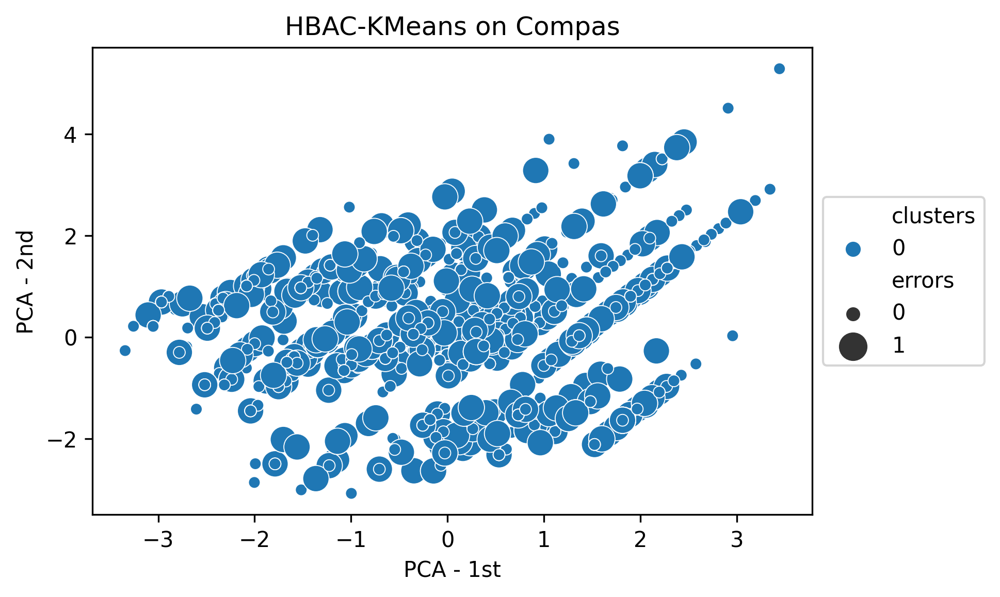

average_accuracy is:  0.6668466522678186


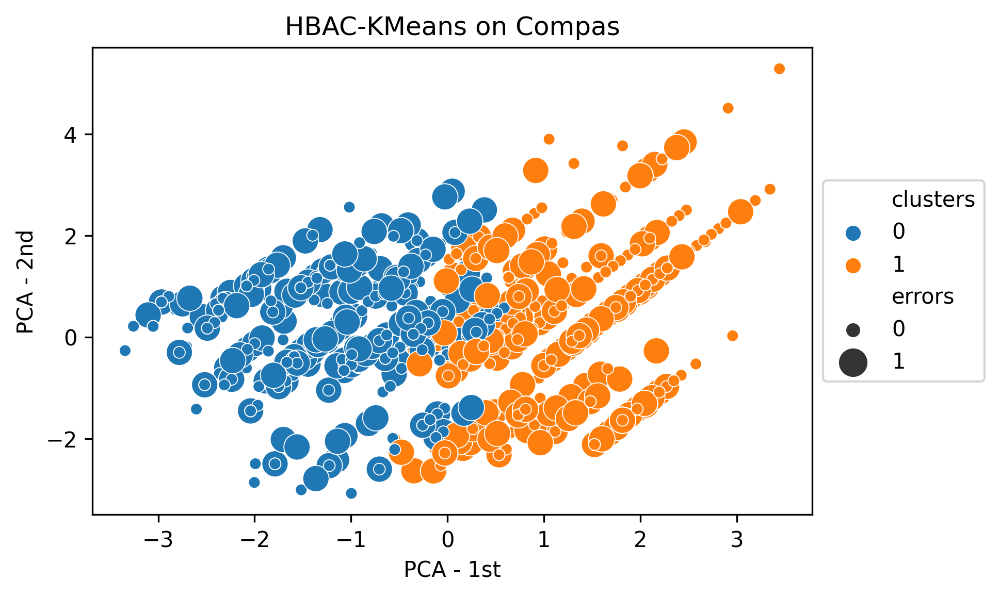

--> Cluster with the highest variance: 1


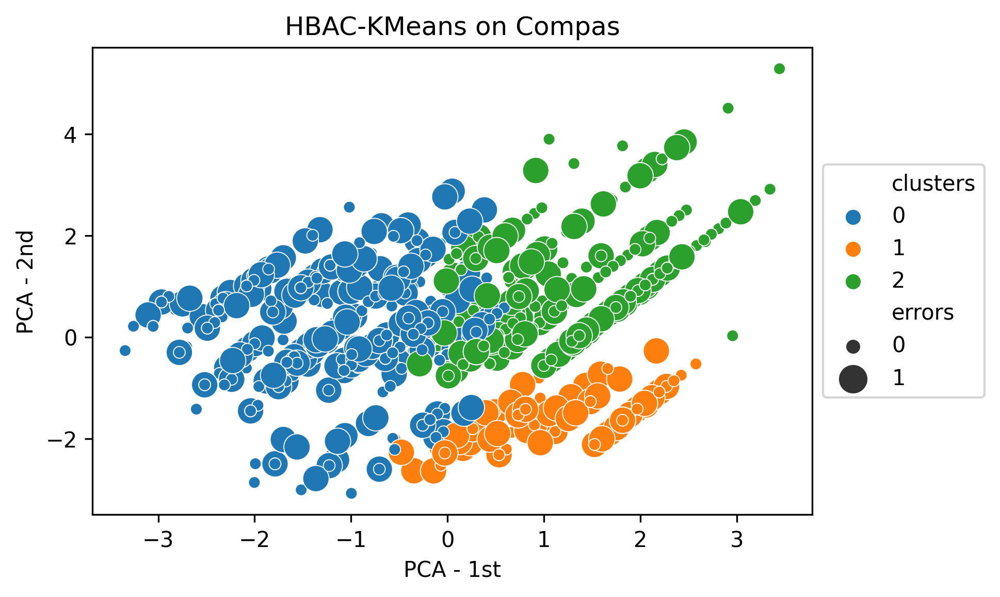

--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1


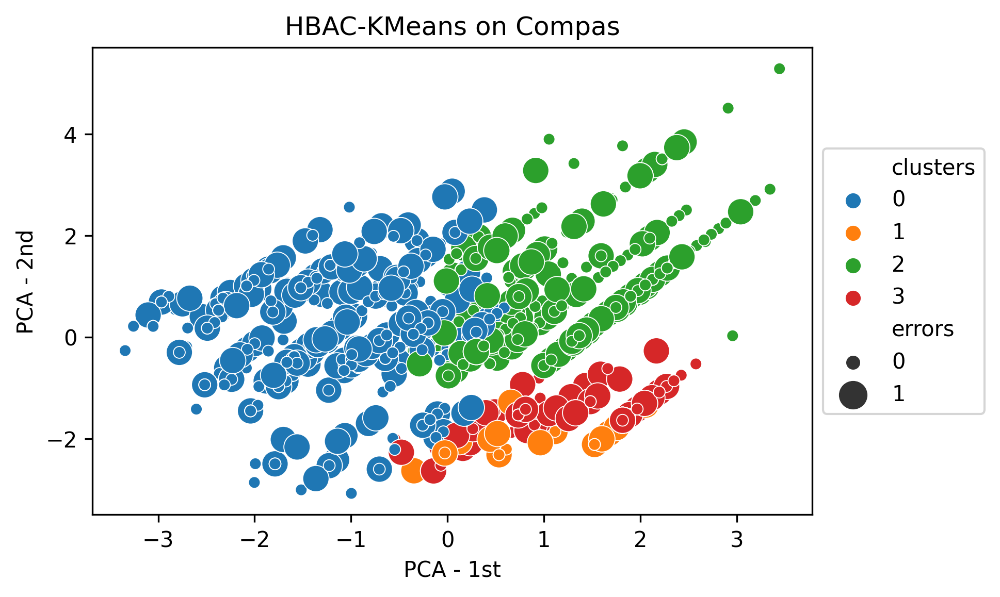

--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 3


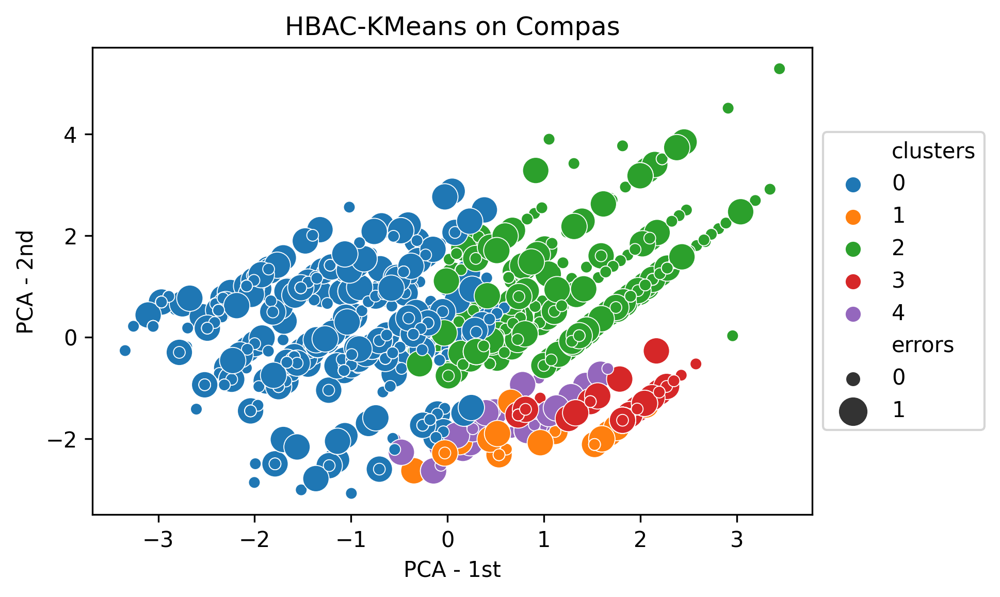

--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 4


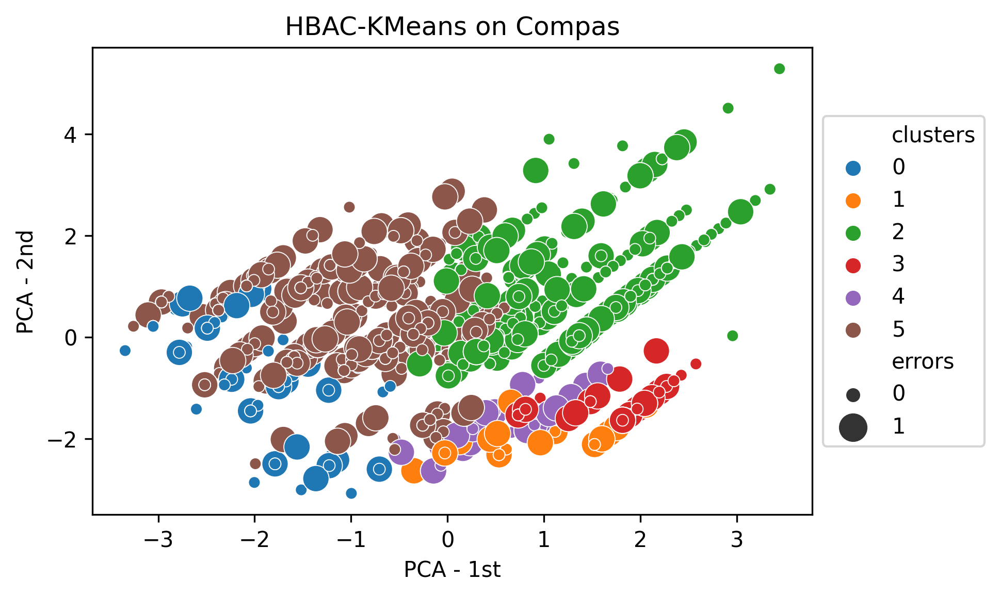

--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 4


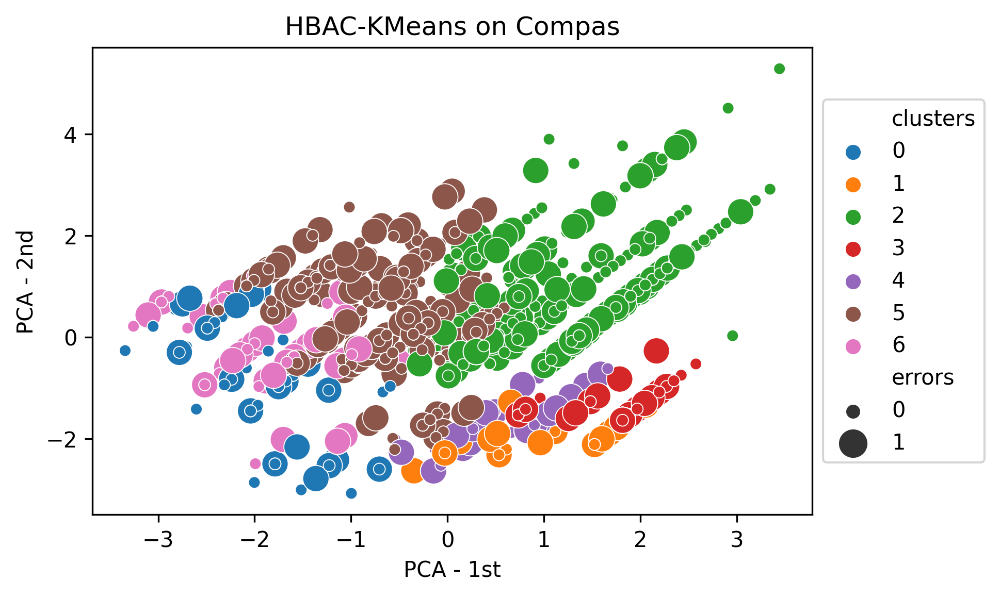

--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 4
MAX_ITER
[0.006344515187919283, 0.004582221680503907, 0.003871563001809219, 0.00933582883709368, 0.00933582883709368, 0.00889274035605523, 0.00889274035605523, 0.00783036812498919, 0.00783036812498919, 0.00783036812498919, 0.00783036812498919, 0.00783036812498919, 0.00783036812498919, 0.00783036812498919, 0.00783036812498919, 0.00783036812498919, 0.00783036812498919, 0.00783036812498919]


In [9]:
MAX_ITER = 20
x = 0 # initial cluster number
initial_bias = 0
pca_plot(full_data)
variance_list = []
average_accuracy = accuracy(full_data)
minimal_splittable_cluster_size = round(0.05 * len(full_data))
minimal_acceptable_cluster_size = round(0.03 * len(full_data))
print("average_accuracy is: ", average_accuracy) 

for i in range(1, MAX_ITER):
    if i != 1:
        variance_list.append(calculate_variance(full_data)) 
    full_data['new_clusters'] = -1
    candidate_cluster = full_data.loc[full_data['clusters'] == x] 

    if len(candidate_cluster) < minimal_splittable_cluster_size:
        x = get_random_cluster(full_data['clusters'])
        continue
    
    # Apply Kmeans 
    kmeans_algo = KMeans(**clus_model_kwargs).fit(candidate_cluster.drop(['clusters', 'new_clusters', 'predicted_class', 'true_class', 'errors'], axis=1))
    
    candidate_cluster['new_clusters'] = pd.DataFrame(kmeans_algo.predict(candidate_cluster.drop(['clusters', 'new_clusters', 'predicted_class', 'true_class', 'errors'], axis=1)),index=candidate_cluster.index) 
    full_data['new_clusters'] = candidate_cluster['new_clusters'].combine_first(full_data['new_clusters'])

    max_abs_bias = get_max_negative_bias(full_data) # was get_max_abs_bias, but now it only finds the discriminated clusters
    min_new_size = get_min_cluster_size(full_data)
    
    if (max_abs_bias <= initial_bias) & (min_new_size > minimal_acceptable_cluster_size): #abs: >
        # Add new cluster
        n_cluster = max(full_data['clusters'])
        full_data['clusters'][full_data['new_clusters'] == 1] =  n_cluster + 1
        
        pca_plot(full_data)
        x = get_next_cluster(full_data)
        initial_bias = max_abs_bias
    else:
        x = get_random_cluster(full_data['clusters'])
        
print('MAX_ITER')
print(variance_list)

### 1. Analysing the clustering results


In [10]:
# Goal 1: Identifying highest biased cluster
c = get_max_bias_cluster(full_data)
highest_biased_cluster = full_data[full_data['clusters']==c]
len(highest_biased_cluster)

accuracy_full_data = accuracy(full_data)
most_biased_cluster_kmeans_aware = bias_acc(full_data, c, 'clusters')
full_data[full_data['clusters']==c]

print('General accuracy of classifier on this dataset:', accuracy_full_data)
# print('Number of clusters: ', full_data['clusters'].unique()) 
print(f"cluster {c} has the highest discrimination bias")
print(most_biased_cluster_kmeans_aware)

2 has bias -0.04387188135859632
5 has bias 0.07383731647707337
3 has bias -0.008445003957030406
6 has bias -0.013694795452855457
1 has bias -0.06544804520816516
0 has bias 0.05318675889328062
4 has bias -0.2169475655430712
General accuracy of classifier on this dataset: 0.6668466522678186
cluster 4 has the highest discrimination bias
-0.2169475655430712


In [11]:
discriminated_cluster = full_data[full_data['clusters']==c]
print('Number of instances in discriminated cluster:', len(discriminated_cluster))
print('Number of errors in discriminated clusters: ', len(discriminated_cluster.loc[discriminated_cluster['errors']==1]))
discriminated_cluster

Number of instances in discriminated cluster: 72
Number of errors in discriminated clusters:  39


,Number_of_Priors,score_factor,Age_Above_FourtyFive,Age_Below_TwentyFive,African_American,Asian,Hispanic,Native_American,Other,Female,Misdemeanor,scaled_errors,predicted_class,true_class,errors,clusters,new_clusters
2905,1.027202,1.120618,-0.536563,1.902223,-1.022941,-0.073681,-0.309609,0.0,-0.240169,-0.47932,-0.768808,0.8,1,0,1,4,-1
4683,-0.680882,1.120618,-0.536563,1.902223,-1.022941,-0.073681,3.229876,0.0,-0.240169,-0.47932,-0.768808,0.8,0,1,1,4,-1
4100,-0.040350,1.120618,-0.536563,1.902223,-1.022941,-0.073681,-0.309609,0.0,-0.240169,-0.47932,-0.768808,0.0,1,1,0,4,-1
457,1.240713,1.120618,-0.536563,1.902223,-1.022941,-0.073681,-0.309609,0.0,-0.240169,-0.47932,1.300715,0.0,1,1,0,4,-1
5094,1.454223,1.120618,-0.536563,1.902223,-1.022941,-0.073681,-0.309609,0.0,-0.240169,-0.47932,-0.768808,0.8,1,0,1,4,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5297,-0.040350,1.120618,-0.536563,1.902223,-1.022941,-0.073681,-0.309609,0.0,-0.240169,-0.47932,-0.768808,0.8,1,0,1,4,-1
5254,0.173160,1.120618,-0.536563,1.902223,-1.022941,-0.073681,-0.309609,0.0,-0.240169,-0.47932,-0.768808,0.8,1,0,1,4,-1
1678,-0.253861,1.120618,-0.536563,1.902223,-1.022941,-0.073681,3.229876,0.0,-0.240169,-0.47932,-0.768808,0.8,0,1,1,4,-1
1414,-0.680882,1.120618,-0.536563,1.902223,-1.022941,-0.073681,-0.309609,0.0,-0.240169,-0.47932,1.300715,0.0,1,1,0,4,-1


In [13]:
not_discriminated = full_data[full_data['clusters']!=c]
difference = (discriminated_cluster.mean()) - (not_discriminated.mean()) 
difference

Number_of_Priors       -0.233276
score_factor            1.165947
Age_Above_FourtyFive   -0.558267
Age_Below_TwentyFive    1.979167
African_American       -1.064319
Asian                   0.120529
Hispanic                0.547383
Native_American         0.000000
Other                   0.259231
Female                 -0.498708
Misdemeanor            -0.231691
scaled_errors           0.173558
predicted_class         0.419507
true_class              0.191136
errors                  0.216948
clusters                0.393258
new_clusters            0.000000
dtype: float64

In [19]:
# unscaling the discriminated cluster
unscaled_discriminated = raw_data.loc[discriminated_cluster.index, :]

# unscaled other data
unscaled_remaining = raw_data.drop(discriminated_cluster.index)

display(unscaled_remaining.describe())
display(unscaled_discriminated.describe())
# print('discriminated:', unscaled_discriminated)
# raw_data.loc[!discriminated_cluster.index, :]

# full_data.iloc[: , : 24]
# print(discriminated_cluster.index)


,Number_of_Priors,score_factor,Age_Above_FourtyFive,Age_Below_TwentyFive,African_American,Asian,Hispanic,Native_American,Other,Female,Misdemeanor,predicted_class,true_class,errors
count,1780.000000,1780.000000,1780.000000,1780.000000,1780.000000,1780.000000,1780.000000,1780.0,1780.000000,1780.000000,1780.000000,1780.000000,1780.000000,1780.000000
mean,3.231461,0.420787,0.232584,0.184831,0.532022,0.005056,0.081461,0.0,0.052247,0.194382,0.375843,0.344382,0.447753,0.324719
std,4.743602,0.493824,0.422598,0.388270,0.499114,0.070947,0.273618,0.0,0.222588,0.395835,0.484476,0.475300,0.497402,0.468401
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,4.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
max,38.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


,Number_of_Priors,score_factor,Age_Above_FourtyFive,Age_Below_TwentyFive,African_American,Asian,Hispanic,Native_American,Other,Female,Misdemeanor,predicted_class,true_class,errors
count,72.000000,72.0,72.0,72.0,72.0,72.000000,72.000000,72.0,72.000000,72.0,72.000000,72.000000,72.000000,72.000000
mean,2.138889,1.0,0.0,1.0,0.0,0.013889,0.236111,0.0,0.111111,0.0,0.263889,0.763889,0.638889,0.541667
std,2.686982,0.0,0.0,0.0,0.0,0.117851,0.427672,0.0,0.316475,0.0,0.443833,0.427672,0.483693,0.501757
min,0.000000,1.0,0.0,1.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.0,0.0,1.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,1.000000,0.000000,0.000000
50%,1.000000,1.0,0.0,1.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,1.000000,1.000000,1.000000
75%,3.000000,1.0,0.0,1.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,1.000000,1.000000,1.000000,1.000000
max,11.000000,1.0,0.0,1.0,0.0,1.000000,1.000000,0.0,1.000000,0.0,1.000000,1.000000,1.000000,1.000000


In [20]:
import scipy.stats as stats

In [21]:
for i in unscaled_remaining:
    welch_i = stats.ttest_ind(unscaled_discriminated[i], unscaled_remaining[i], equal_var=False)
    print(i)
    print('this is the p-value:', welch_i.pvalue)

Number_of_Priors
this is the p-value: 0.0016169559334700341
score_factor
this is the p-value: 0.0
Age_Above_FourtyFive
this is the p-value: 2.1257148503917883e-104
Age_Below_TwentyFive
this is the p-value: 0.0
African_American
this is the p-value: 1.1988049725187782e-295
Asian
this is the p-value: 0.5297847607172685
Hispanic
this is the p-value: 0.0032468441832204167
Native_American
this is the p-value: nan
Other
this is the p-value: 0.12239903031009451
Female
this is the p-value: 1.3593654791650166e-85
Misdemeanor
this is the p-value: 0.03982372171116579
predicted_class
this is the p-value: 5.32587859947787e-12
true_class
this is the p-value: 0.001541911219931428
errors
this is the p-value: 0.0005536200239665563


In [62]:
unscaled_discriminated = unscaled_discriminated.iloc[: , : 24]
# print(unscaled_discriminated.head())
unscaled_remaining = unscaled_remaining.iloc[: , : 24]

welch_age = stats.ttest_ind(unscaled_discriminated['Age'], unscaled_remaining['Age'], equal_var=False)
# welch_age.pvalue
for i in range(i, unscaled_remaining):
welch_job = stats.ttest_ind(unscaled_discriminated['Purpose_radio/TV'], unscaled_remaining['Purpose_radio/TV'], equal_var=False)
print('Welchs test for :', welch_job.pvalue)

Welchs test for %f: 3.7380239872901094e-30


In [22]:
research = pd.DataFrame()
research['unscaled_discriminated'] = unscaled_discriminated.mean()
research['unscaled_remaining'] = unscaled_remaining.mean()
research['difference'] = unscaled_discriminated.mean() - unscaled_remaining.mean()

research

,unscaled_discriminated,unscaled_remaining,difference
Number_of_Priors,2.138889,3.231461,-1.092572
score_factor,1.000000,0.420787,0.579213
Age_Above_FourtyFive,0.000000,0.232584,-0.232584
Age_Below_TwentyFive,1.000000,0.184831,0.815169
African_American,0.000000,0.532022,-0.532022
Asian,0.013889,0.005056,0.008833
Hispanic,0.236111,0.081461,0.154650
Native_American,0.000000,0.000000,0.000000
Other,0.111111,0.052247,0.058864
Female,0.000000,0.194382,-0.194382


In [25]:
# ridge plot
column_names = unscaled_discriminated.iloc[: , : ].columns
# full_data.iloc[: , : 24]
column_names

Index(['Number_of_Priors', 'score_factor', 'Age_Above_FourtyFive',
       'Age_Below_TwentyFive', 'African_American', 'Asian', 'Hispanic',
       'Native_American', 'Other', 'Female', 'Misdemeanor', 'predicted_class',
       'true_class', 'errors'],
      dtype='object')

# RidgePlot HBAC - KMeans


In [29]:
df

,Number_of_Priors,score_factor,Age_Above_FourtyFive,Age_Below_TwentyFive,African_American,Asian,Hispanic,Native_American,Other,Female,Misdemeanor,predicted_class,true_class,errors
2905,8,1,0,1,0,0,0,0,0,0,0,1,0,1
4683,0,1,0,1,0,0,1,0,0,0,0,0,1,1
4100,3,1,0,1,0,0,0,0,0,0,0,1,1,0
457,9,1,0,1,0,0,0,0,0,0,1,1,1,0
5094,10,1,0,1,0,0,0,0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5297,3,1,0,1,0,0,0,0,0,0,0,1,0,1
5254,4,1,0,1,0,0,0,0,0,0,0,1,0,1
1678,2,1,0,1,0,0,1,0,0,0,0,0,1,1
1414,0,1,0,1,0,0,0,0,0,0,1,1,1,0


In [26]:
# not_discriminated = full_data[full_data['clusters']!=c]
# df = not_discriminated

# Let's grab only the subset of columns displayed in the example

# column_names = discriminated_cluster.iloc[: , : 14].columns
df = unscaled_discriminated[column_names]

# Not only does 'ridgeplot(...)' come configured with sensible defaults
# but is also fully configurable to your own style and preference!
fig = ridgeplot(
    samples=df.values.T,
    bandwidth=4,
    kde_points=np.linspace(-12.5, 112.5, 400),
    colorscale="viridis",
    colormode="index",
    coloralpha=0.6,
    labels=column_names,
    spacing=5 / 9,
)

# Again, update the figure layout to your liking here
fig.update_layout(
    title="HBAC-KMeans on German Credit: Discriminated Cluster distribution",
    height=650,
    width=800,
    plot_bgcolor="rgba(255, 255, 255, 0.0)",
    xaxis_gridcolor="rgba(0, 0, 0, 0.1)",
    yaxis_gridcolor="rgba(0, 0, 0, 0.1)",
    yaxis_title="Assigned Probability (%)",
)
fig.show()

Text(0.5, 1.0, 'Variance of Instances during Iterations')

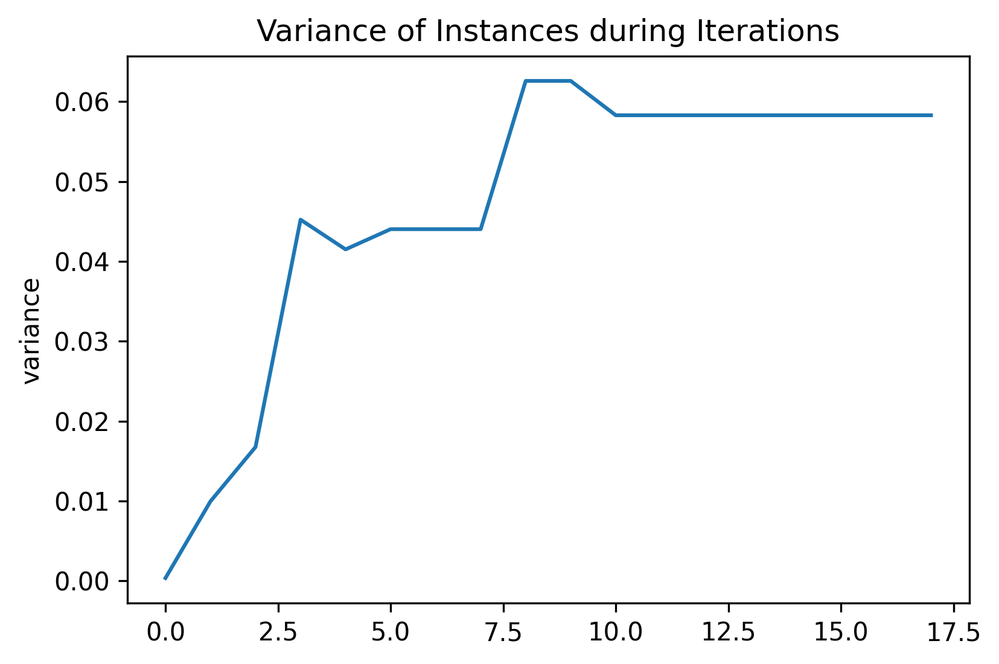

In [47]:
variance_df_kmeans = pd.DataFrame(variance_list).rename(columns={0:"variance"})
sns.lineplot(data=variance_df_kmeans, x=variance_df_kmeans.index,y="variance").set_title('Variance of Instances during Iterations')

## Baseline KMeans

In [ ]:
full_data = initialize_dataset(raw_data)
full_data.head()

In [ ]:
# Same number of clusters as the found clusters by the bias-aware clustering algorithm?
baseline_kmeans = KMeans(n_clusters=11, init="k-means++", n_init=10, max_iter=300, random_state=2).fit(full_data.drop(['clusters', 'new_clusters', 'predicted_class', 'true_class', 'errors'], axis=1))

full_data['clusters'] = pd.DataFrame(baseline_kmeans.predict(full_data.drop(['clusters', 'new_clusters', 'predicted_class', 'true_class',
                    'errors'], axis=1)),index=full_data.index) 


In [ ]:
# Goal 1: Identifying highest biased cluster
c = get_max_bias_cluster(full_data)
print(f"cluster {c} has the highest negative bias")
print(full_data['clusters'].unique())
highest_biased_cluster = full_data[full_data['clusters']==c]
len(highest_biased_cluster)

accuracy_full_data = accuracy(full_data)
print('Overall accuracy:', accuracy_full_data)

most_biased_cluster_baselinekm = bias_acc(full_data, c, 'clusters')

full_data[full_data['clusters']==c]
print('Highest found discrimination bias:', most_biased_cluster_baselinekm)

In [ ]:
discriminated_cluster = full_data[full_data['clusters']==c]
print('Number of instances in discriminated cluster:', len(discriminated_cluster))
print('Number of errors in discriminated clusters: ', len(discriminated_cluster.loc[discriminated_cluster['errors']==1]))
discriminated_cluster

In [ ]:
# Full dataset ridgeplot

df = raw_data
column_names = raw_data.iloc[: , : 12].columns

df = df[column_names]
df.head()

In [ ]:
# not_discriminated = full_data[full_data['clusters']!=c]
# df = not_discriminated

# Let's grab only the subset of columns displayed in the example
# column_names = ["x", "y", "scaled_errors", "errors"]
# column_names = discriminated_cluster.iloc[: , : 14].columns
# df = df[column_names]

# Not only does 'ridgeplot(...)' come configured with sensible defaults
# but is also fully configurable to your own style and preference!
fig = ridgeplot(
    samples=df.values.T,
    bandwidth=4,
    kde_points=np.linspace(-12.5, 112.5, 400),
    colorscale="viridis",
    colormode="index",
    coloralpha=0.6,
    labels=column_names,
    spacing=5 / 9,
)

# Again, update the figure layout to your liking here
fig.update_layout(
    title="What is the distribution of the highly discriminated cluster?",
    height=650,
    width=800,
    plot_bgcolor="rgba(255, 255, 255, 0.0)",
    xaxis_gridcolor="rgba(0, 0, 0, 0.1)",
    yaxis_gridcolor="rgba(0, 0, 0, 0.1)",
    yaxis_title="Assigned Probability (%)",
)
fig.show()

# 2. Bias-Aware DBSCAN

In [96]:
full_data = initialize_dataset(raw_data)
full_data.head()

,Age,Job,Credit amount,Duration,Purpose_car,Purpose_domestic appliances,Purpose_education,Purpose_furniture/equipment,Purpose_radio/TV,Purpose_repairs,...,Check_rich,Age_cat_Young,Age_cat_Adult,Age_cat_Senior,scaled_errors,predicted_class,true_class,errors,clusters,new_clusters
136,-0.829278,0.235354,2.140240,0.517353,1.637071,0.0,-0.286972,-0.493197,-0.594089,-0.104828,...,-0.149071,1.402762,-0.83887,-0.239732,0.0,0,0.0,0.0,0,-1
76,-0.246248,0.235354,0.292574,1.725386,-0.610847,0.0,-0.286972,-0.493197,1.683251,-0.104828,...,-0.149071,1.402762,-0.83887,-0.239732,0.8,0,1.0,1.0,0,-1
280,-1.162437,0.235354,0.055255,-0.449073,1.637071,0.0,-0.286972,-0.493197,-0.594089,-0.104828,...,-0.149071,-0.712879,-0.83887,-0.239732,0.0,0,0.0,0.0,0,-1
174,-0.912567,0.235354,0.073541,0.034140,-0.610847,0.0,3.484660,-0.493197,-0.594089,-0.104828,...,-0.149071,1.402762,-0.83887,-0.239732,0.8,0,1.0,1.0,0,-1
210,-0.329538,0.235354,-0.061615,-0.932286,-0.610847,0.0,-0.286972,-0.493197,1.683251,-0.104828,...,-0.149071,1.402762,-0.83887,-0.239732,0.0,0,0.0,0.0,0,-1


## Determining epsilon

Text(0.5, 1.0, 'Determining Optimal Value Epsilon')

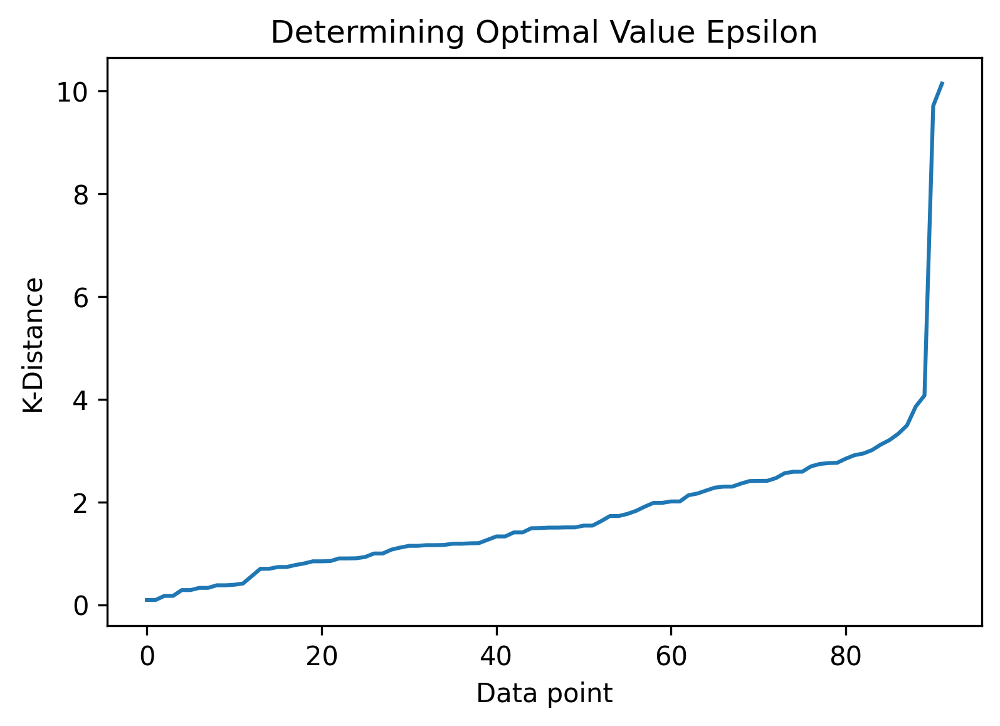

In [97]:
# determining epsilon
from sklearn.neighbors import NearestNeighbors

#for wine dataset
nn_features = full_data.iloc[: , : 14] #wine + including scaled errors
# for german credit:
# nn_features = full_data.iloc[: , : 25]

neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(nn_features)
distances, indices = nbrs.kneighbors(nn_features)

distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
plt.xlabel('Data point')
plt.ylabel('K-Distance')
plt.title('Determining Optimal Value Epsilon')

# plt.savefig('dbscan_wine_epsilon.png', dpi=300)

In [ ]:
round(0.05 * len(full_data))

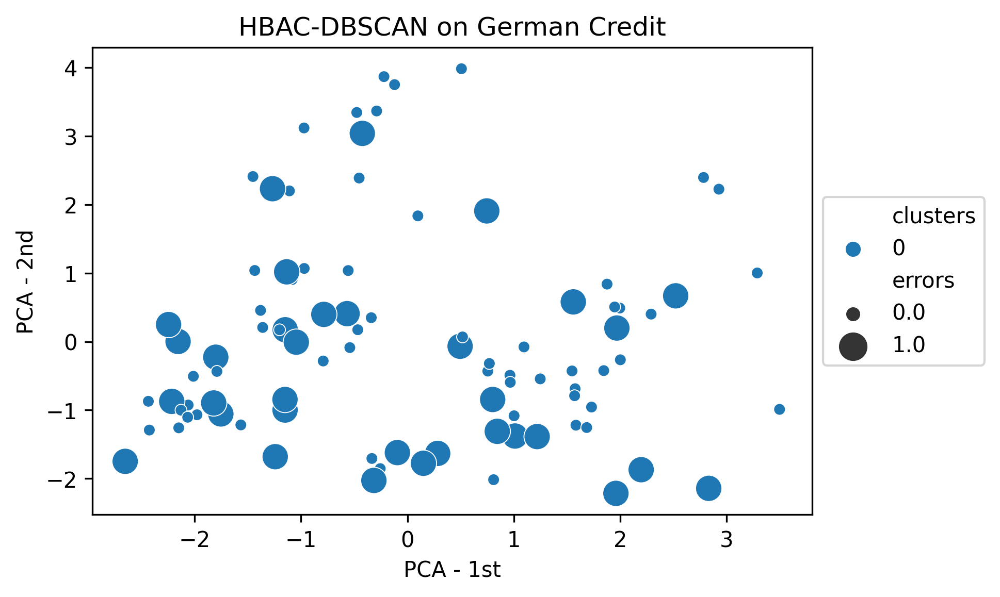

this is the current cluster:  0
smallest cluster:  3


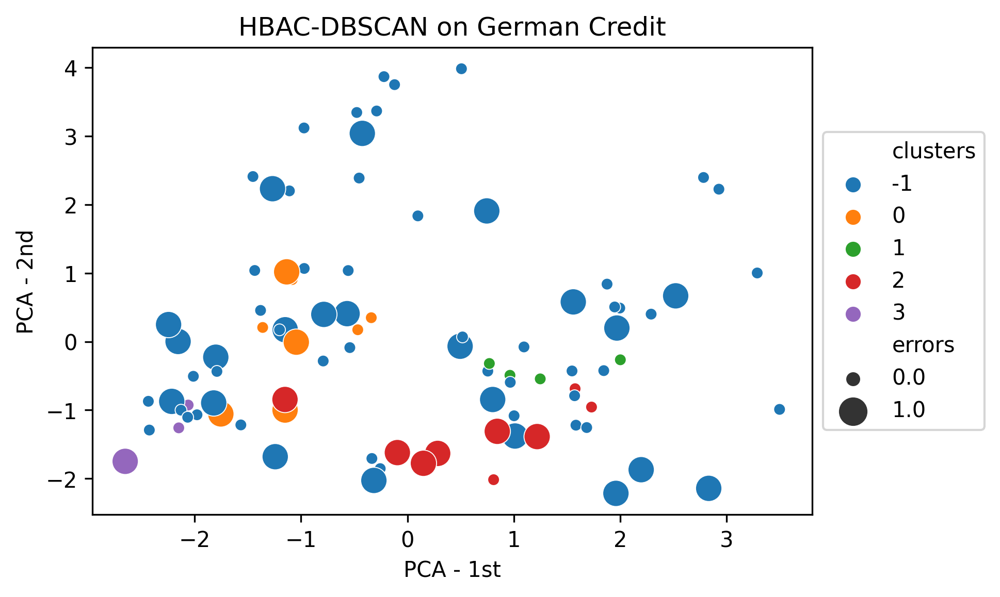

--> Cluster with the highest variance: 0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
smallest cluster:  6


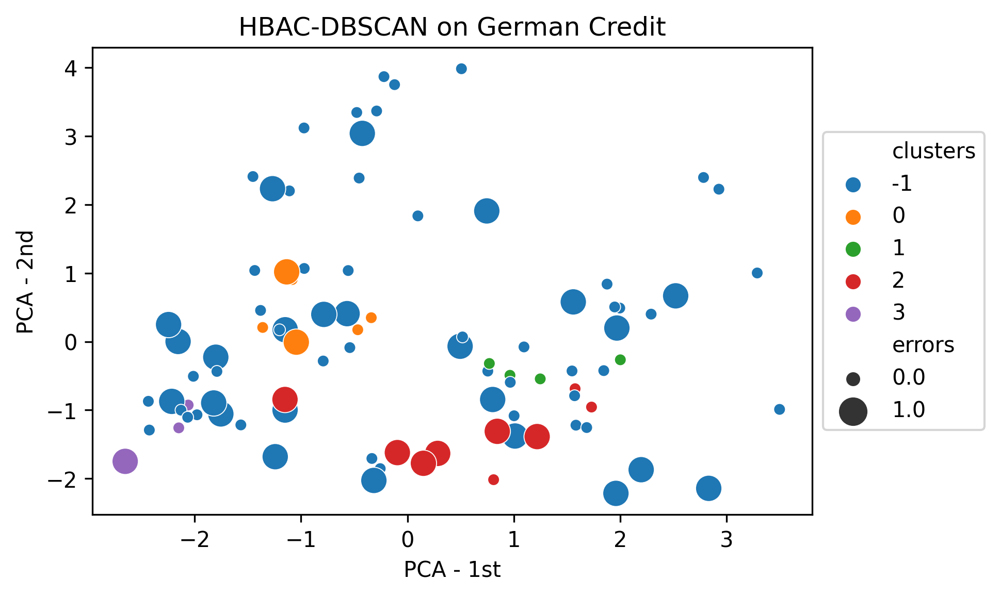

--> Cluster with the highest variance: 0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
smallest cluster:  5


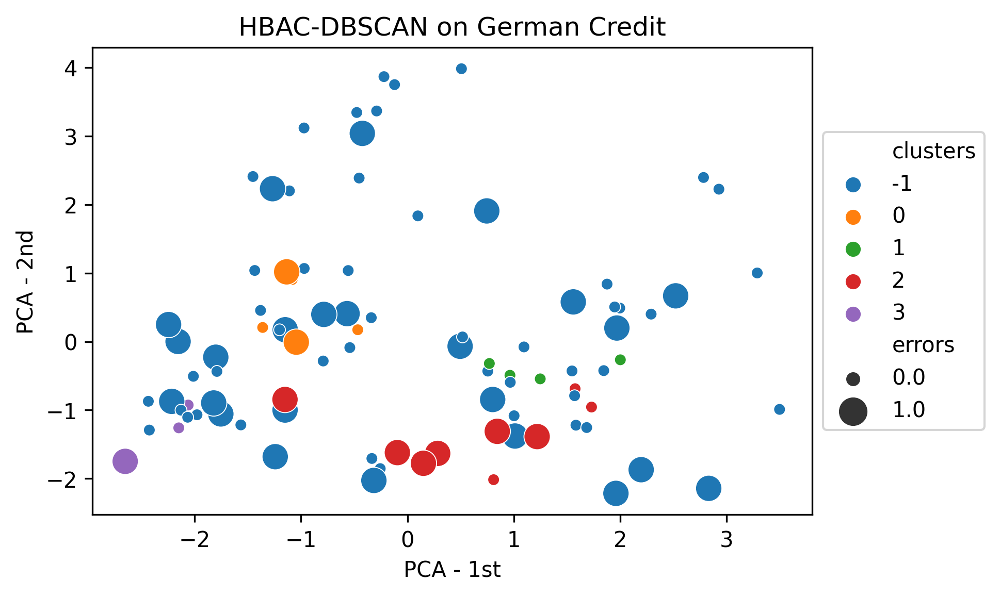

--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
this is the current cluster:  0
MAX_ITER
0.6413043478260869
[0.05992955265105567, 0.05992955265105567, 0.05992955265105567, 0.05992955265105567, 0.05992955265105567, 0.05165413157479639, 0.05165413157479639, 0.05165413157479639, 0.05165413157479639, 0.05165413157479639, 0.05165413157479639, 0.05165413157479639, 0.05165413157479639, 0.05165413157479639, 0.05165413157479639, 0.05165413157479639, 0.05165413157479639, 0.05165413157479639, 0.05165413157479639, 0.05165413157479639, 0.05165413157479639, 0.05165413157479639, 0.05165413157479639, 0.05313417746745106, 0.05313417746745106, 0.05313417746745106, 0.05313417746745106, 0.05313417746745106]


In [98]:
MAX_ITER = 30
epsilon =  3
minimum_samples = 3 # round(0.02 * len(full_data)) # 2*dim?
x = 0 # cluster number
initial_bias = 0
pca_plot(full_data)
variance_list = []
minimal_splittable_cluster_size = round(0.03 * len(full_data))
minimal_acceptable_cluster_size = round(0.01 * len(full_data))
average_accuracy = accuracy(full_data)

for i in range(1, MAX_ITER):
    print('this is the current cluster: ', x)
    epsilon = epsilon - 0.01
    if len(full_data['clusters'].unique()) != 1:
        variance_list.append(calculate_variance(full_data))

    full_data['new_clusters'] = -2
    candidate_cluster = full_data.loc[full_data['clusters'] == x] 

    if len(candidate_cluster) < minimal_splittable_cluster_size:
        x = get_random_cluster(full_data['clusters'])
        continue
    
    # Apply DBSCAN
    candidate_cluster['new_clusters'] = pd.DataFrame(DBSCAN(eps=epsilon, min_samples=minimum_samples).fit_predict(candidate_cluster.drop(['clusters', 'new_clusters', 'predicted_class', 'true_class', 'errors'], axis=1)), index=candidate_cluster.index)

    full_data['new_clusters'] = candidate_cluster['new_clusters'].combine_first(full_data['new_clusters'])
    
    if (len(full_data['new_clusters'].unique()) <= 2): # to check whether a new cluster is found
        continue

    max_neg_bias = get_max_negative_bias(full_data) #get max abs bias
    min_new_size = get_min_cluster_size(full_data)
    print("smallest cluster: ", min_new_size)
    
    if (max_neg_bias <= initial_bias) & (min_new_size > minimal_acceptable_cluster_size): #>
        # Add new cluster
        n_cluster = max(full_data['clusters'])
        # print(full_data['new_clusters'])
        
        first = True
        dif = 1
        for clstr in full_data['new_clusters'].unique():
            if (clstr == -1):
                full_data['clusters'][full_data['new_clusters'] == clstr] = -1
            elif (clstr == -2):
                continue
            elif first:
                full_data['clusters'][full_data['new_clusters'] == clstr] = x
                first = False
            else:
                full_data['clusters'][full_data['new_clusters'] == clstr] =  n_cluster + dif
                dif += 1

        pca_plot(full_data)
        x = get_next_cluster(full_data)
        initial_bias = max_neg_bias
    else:
        x = get_random_cluster(full_data['clusters'])
        
print('MAX_ITER')
print(average_accuracy)
print(variance_list)

## 2. DBSCAN Results

In [101]:
# Goal 1: Identifying highest biased cluster
c = get_max_bias_cluster(full_data) #shouldn't this be max_neg_bias_cluster
print(f"cluster {c} has the highest negative bias")
print(full_data['clusters'].unique())
highest_biased_cluster = full_data[full_data['clusters']==c]
len(highest_biased_cluster)

accuracy_full_data = accuracy(full_data)
print('Overall accuracy:', accuracy_full_data)

most_biased_cluster_dbscan_aware = bias_acc(full_data, c, 'clusters')

full_data[full_data['clusters']==c]
print('Highest found negative bias:', most_biased_cluster_dbscan_aware)

1 has bias 0.375
2 has bias -0.34136546184738953
3 has bias 0.02621722846441943
0 has bias -0.04367816091954024
cluster 2 has the highest negative bias
[-1  1  2  3  0]
Overall accuracy: 0.6413043478260869
Highest found negative bias: -0.34136546184738953


In [100]:
discriminated_cluster = full_data[full_data['clusters']==c]
print('Number of instances in discriminated cluster:', len(discriminated_cluster))
print('Number of errors in discriminated clusters: ', len(discriminated_cluster.loc[discriminated_cluster['errors']==1]))
discriminated_cluster



Number of instances in discriminated cluster: 9
Number of errors in discriminated clusters:  6


,Age,Job,Credit amount,Duration,Purpose_car,Purpose_domestic appliances,Purpose_education,Purpose_furniture/equipment,Purpose_radio/TV,Purpose_repairs,...,Check_rich,Age_cat_Young,Age_cat_Adult,Age_cat_Senior,scaled_errors,predicted_class,true_class,errors,clusters,new_clusters
261,1.502839,0.235354,-0.646365,0.275747,-0.610847,0.0,-0.286972,-0.493197,1.683251,-0.104828,...,-0.149071,-0.712879,1.192079,-0.239732,0.0,0,0.0,0.0,2,-2.0
289,0.919810,0.235354,-0.876529,0.275747,-0.610847,0.0,-0.286972,-0.493197,1.683251,-0.104828,...,-0.149071,-0.712879,1.192079,-0.239732,0.8,0,1.0,1.0,2,-2.0
39,-1.079147,0.235354,-1.101524,-0.932286,-0.610847,0.0,-0.286972,-0.493197,1.683251,-0.104828,...,-0.149071,-0.712879,-0.838870,-0.239732,0.8,1,0.0,1.0,2,-2.0
184,-0.079669,0.235354,-0.932181,-0.207466,1.637071,0.0,-0.286972,-0.493197,-0.594089,-0.104828,...,-0.149071,-0.712879,1.192079,-0.239732,0.8,0,1.0,1.0,2,-2.0
265,0.003621,0.235354,-0.964778,-0.449073,-0.610847,0.0,-0.286972,-0.493197,1.683251,-0.104828,...,-0.149071,-0.712879,1.192079,-0.239732,0.8,0,1.0,1.0,2,-2.0
192,-0.079669,0.235354,0.272698,0.517353,-0.610847,0.0,-0.286972,-0.493197,-0.594089,-0.104828,...,-0.149071,-0.712879,1.192079,-0.239732,0.8,0,1.0,1.0,2,-2.0
77,1.169680,0.235354,0.612974,-0.771215,-0.610847,0.0,-0.286972,-0.493197,1.683251,-0.104828,...,-0.149071,-0.712879,1.192079,-0.239732,0.0,0,0.0,0.0,2,-2.0
84,1.252970,-1.430230,-0.363332,-0.851751,-0.610847,0.0,-0.286972,-0.493197,1.683251,-0.104828,...,-0.149071,-0.712879,1.192079,-0.239732,0.0,0,0.0,0.0,2,-2.0
239,0.170201,0.235354,-0.281046,0.758960,-0.610847,0.0,-0.286972,-0.493197,1.683251,-0.104828,...,-0.149071,-0.712879,1.192079,-0.239732,0.8,1,0.0,1.0,2,-2.0


In [102]:
# unscaling the discriminated cluster
unscaled_discriminated = raw_data.loc[discriminated_cluster.index, :]

# unscaled other data
unscaled_remaining = raw_data.drop(discriminated_cluster.index)

for i in unscaled_remaining:
    welch_i = stats.ttest_ind(unscaled_discriminated[i], unscaled_remaining[i], equal_var=False)
    print(i)
    print('this is the p-value:', welch_i.pvalue)

Age
this is the p-value: 0.1518385879310098
Job
this is the p-value: 0.80137968986969
Credit amount
this is the p-value: 0.03664931159772885
Duration
this is the p-value: 0.490242867873929
Purpose_car
this is the p-value: 0.17073559102528044
Purpose_domestic appliances
this is the p-value: nan
Purpose_education
this is the p-value: 0.007367138353835345
Purpose_furniture/equipment
this is the p-value: 8.050611277812887e-06
Purpose_radio/TV
this is the p-value: 0.004247441986235756
Purpose_repairs
this is the p-value: 0.32025235559918713
Purpose_vacation/others
this is the p-value: 0.32025235559918713
Sex_male
this is the p-value: 0.14634762346129876
Housing_own
this is the p-value: 6.476581373998263e-08
Housing_rent
this is the p-value: 2.9414319979377725e-05
Savings_moderate
this is the p-value: 0.0012172681452616615
Savings_no_inf
this is the p-value: 2.941431997937755e-05
Savings_quite rich
this is the p-value: 0.007367138353835345
Savings_rich
this is the p-value: 0.0073671383538353

In [103]:
research_dbscan = pd.DataFrame()
research_dbscan['unscaled_discriminated'] = unscaled_discriminated.mean()
research_dbscan['unscaled_remaining'] = unscaled_remaining.mean()
research_dbscan['difference'] = unscaled_discriminated.mean() - unscaled_remaining.mean()

research_dbscan

,unscaled_discriminated,unscaled_remaining,difference
Age,42.000000,36.409639,5.590361
Job,1.888889,1.855422,0.033467
Credit amount,2032.666667,3358.722892,-1326.056225
Duration,18.666667,20.783133,-2.116466
Purpose_car,0.111111,0.289157,-0.178046
Purpose_domestic appliances,0.000000,0.000000,0.000000
Purpose_education,0.000000,0.084337,-0.084337
Purpose_furniture/equipment,0.000000,0.216867,-0.216867
Purpose_radio/TV,0.777778,0.204819,0.572959
Purpose_repairs,0.000000,0.012048,-0.012048


In [ ]:
full_data = initialize_dataset(raw_data)

In [ ]:
# Baseline DBSCAN

epsilon = 2
min_samples = 3
full_data['clusters'] = pd.DataFrame(DBSCAN(eps=epsilon, min_samples=3).fit_predict(full_data.drop(['clusters', 'new_clusters', 'predicted_class', 'true_class', 'errors'], axis=1)), index=full_data.index)

pca_plot(full_data)

In [ ]:
# Goal 1: Identifying highest biased cluster
c = get_max_bias_cluster(full_data)
print(f"cluster {c} has the highest negative bias")
print(full_data['clusters'].unique())
highest_biased_cluster = full_data[full_data['clusters']==c]
len(highest_biased_cluster)

accuracy_full_data = accuracy(full_data)
print('Overall accuracy:', accuracy_full_data)

most_biased_cluster_dbscan_aware = bias_acc(full_data, c, 'clusters')

full_data[full_data['clusters']==c]
print('Highest found negative bias:', most_biased_cluster_dbscan_aware)

In [ ]:
discriminated_cluster = full_data[full_data['clusters']==c]
print('Number of instances in discriminated cluster:', len(discriminated_cluster))
print('Number of errors in discriminated clusters: ', len(discriminated_cluster.loc[discriminated_cluster['errors']==1]))
discriminated_cluster



# 3. Bias-Aware Mean Shift 


The estimate_bandwidth function to estimate the bandwidth parameter of Mean Shift is significantly better than manually selecting a bandwidth value.

In [157]:
full_data = initialize_dataset(raw_data)
# bandwidth_features = full_data.iloc[: , : 14]
bandwidth_features = full_data.iloc[: , : 25]
bandwidth_features.head()
estimate_bandwidth(bandwidth_features)

5.887950738601325

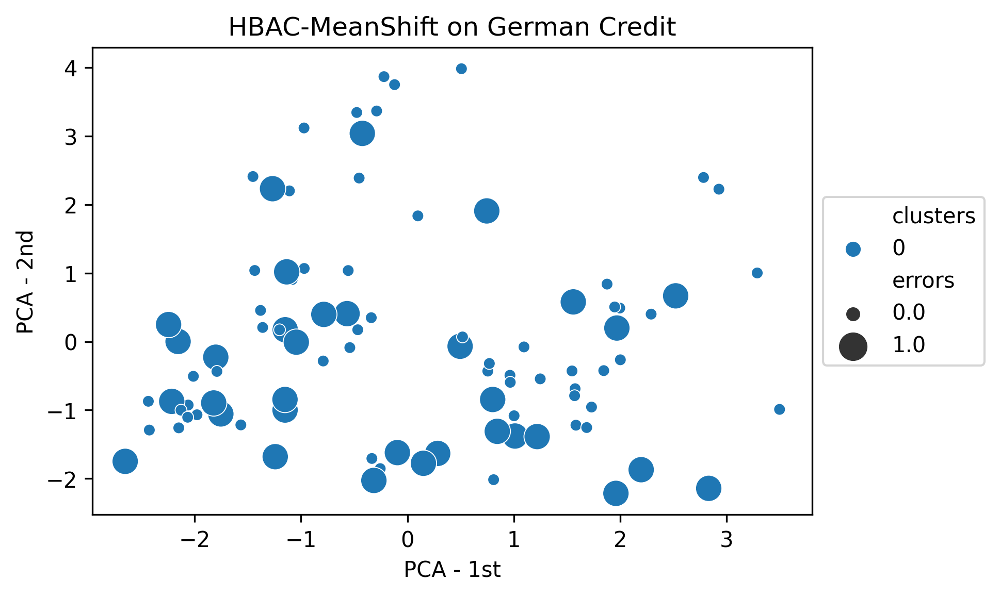

average_accuracy is:  0.6413043478260869
smallest cluster: 1


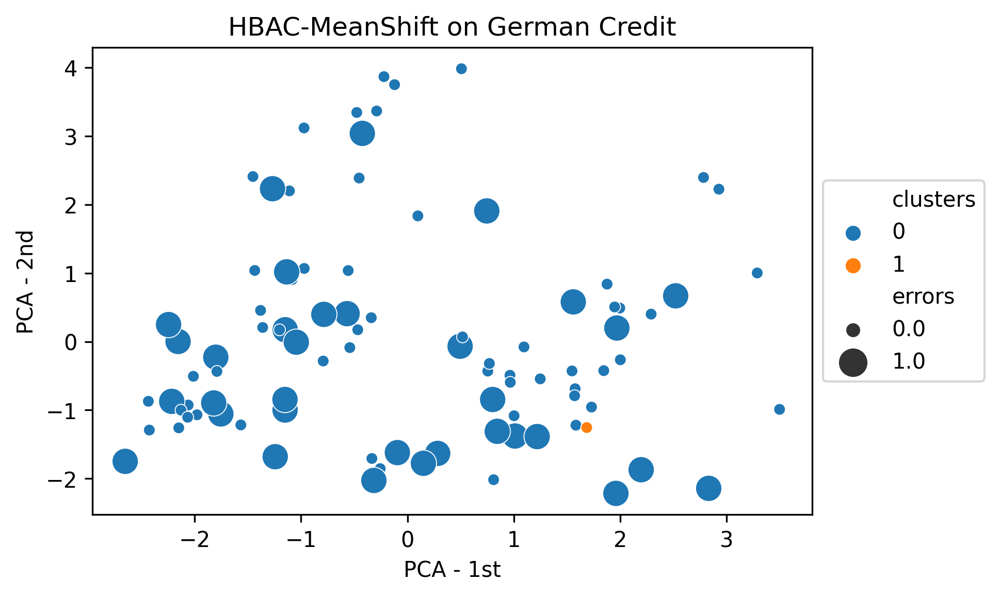

--> Cluster with the highest variance: 0
smallest cluster: 1


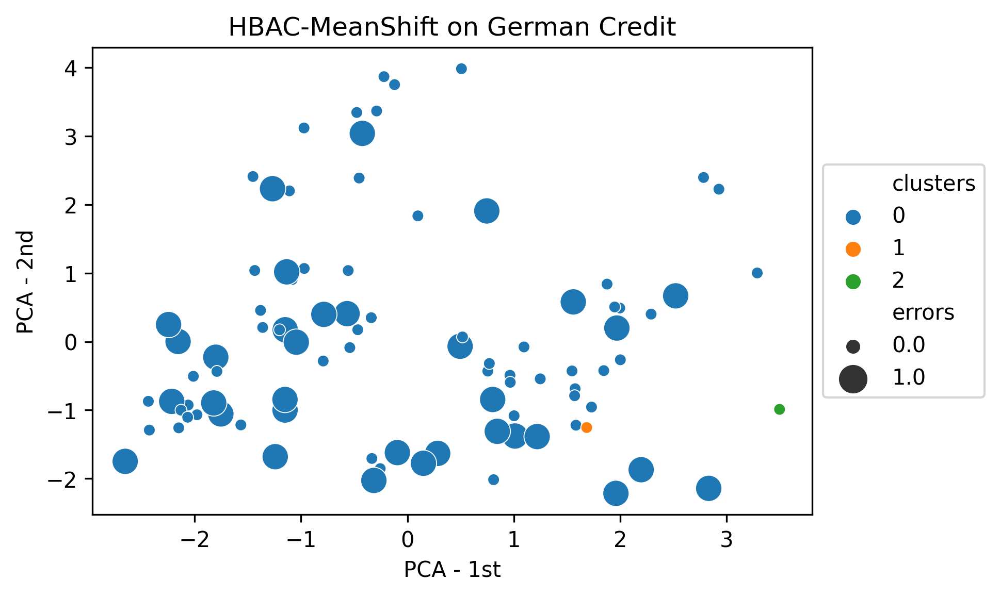

--> Cluster with the highest variance: 0
smallest cluster: 90


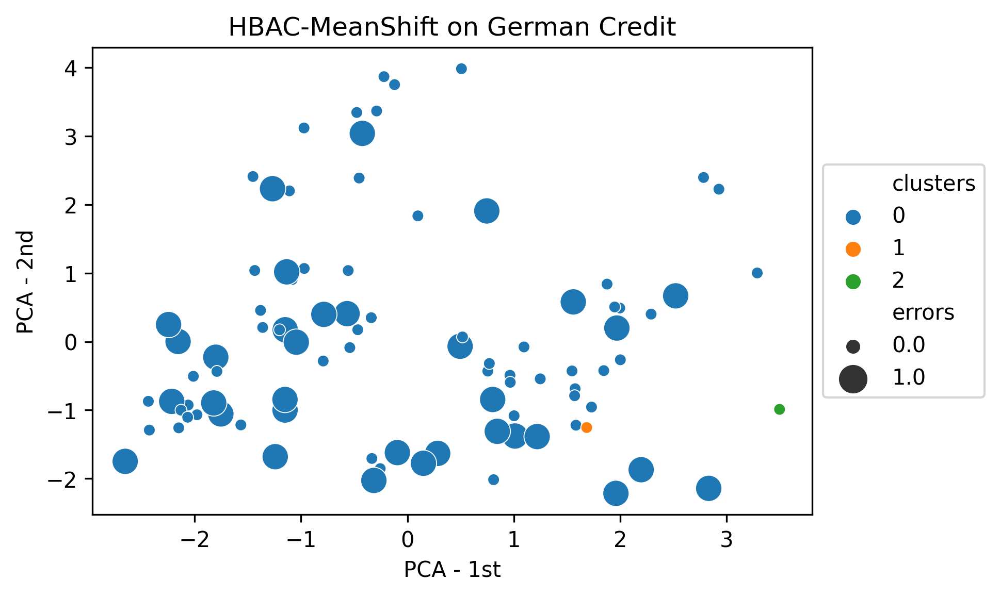

--> Cluster with the highest variance: 0
smallest cluster: 90


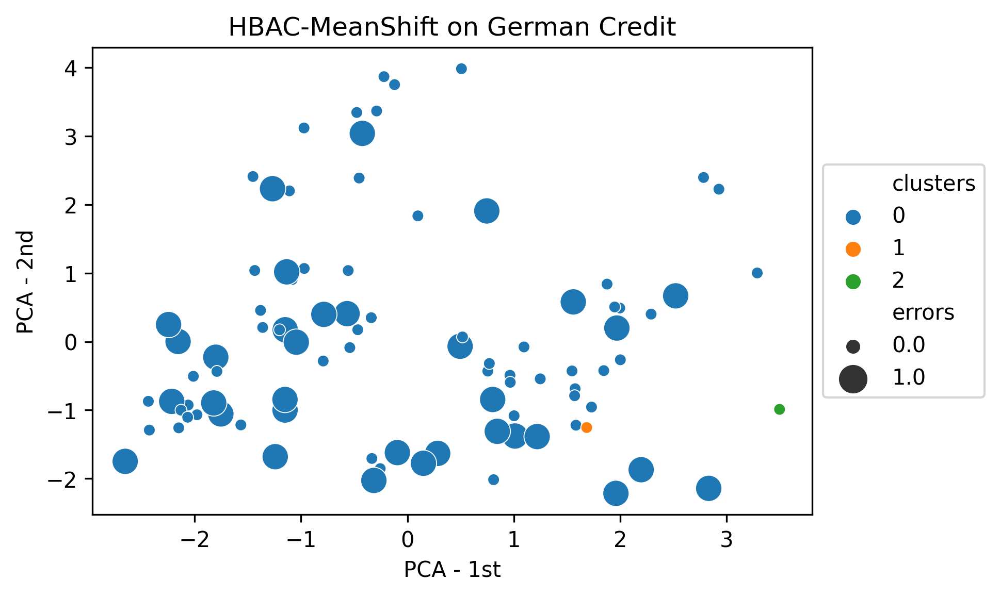

--> Cluster with the highest variance: 0
smallest cluster: 90


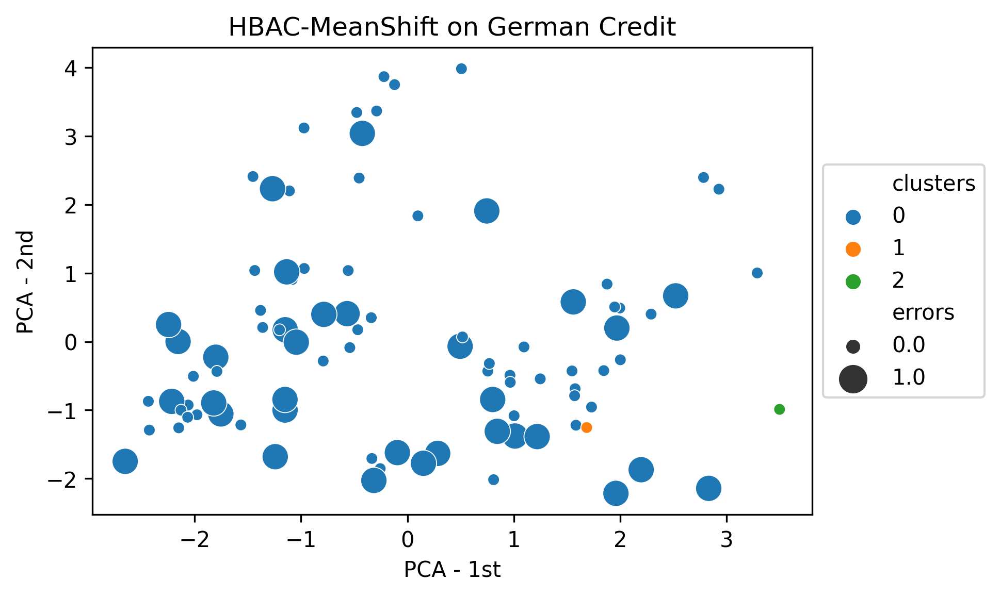

--> Cluster with the highest variance: 0
smallest cluster: 90


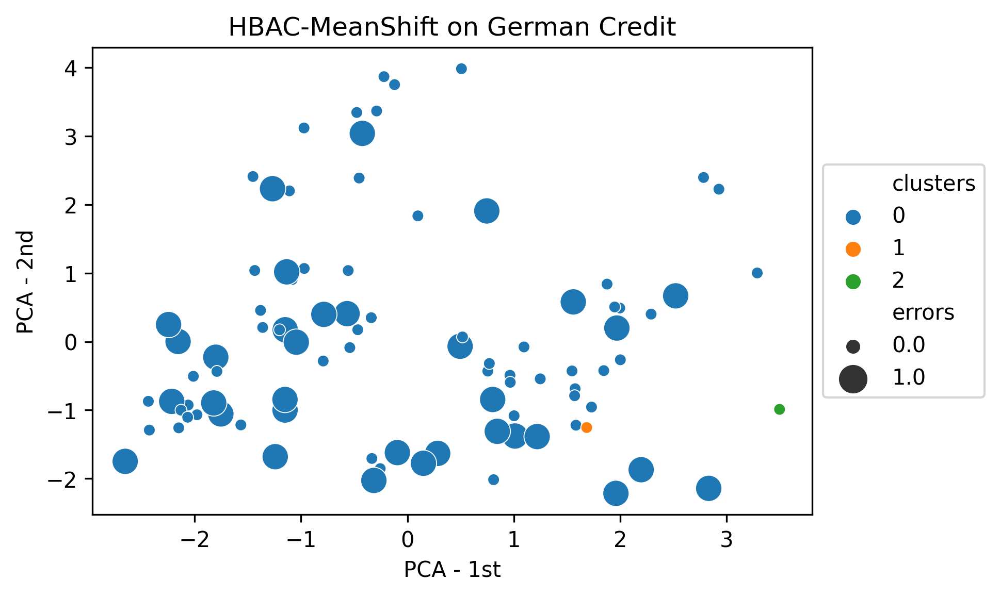

--> Cluster with the highest variance: 0
smallest cluster: 90


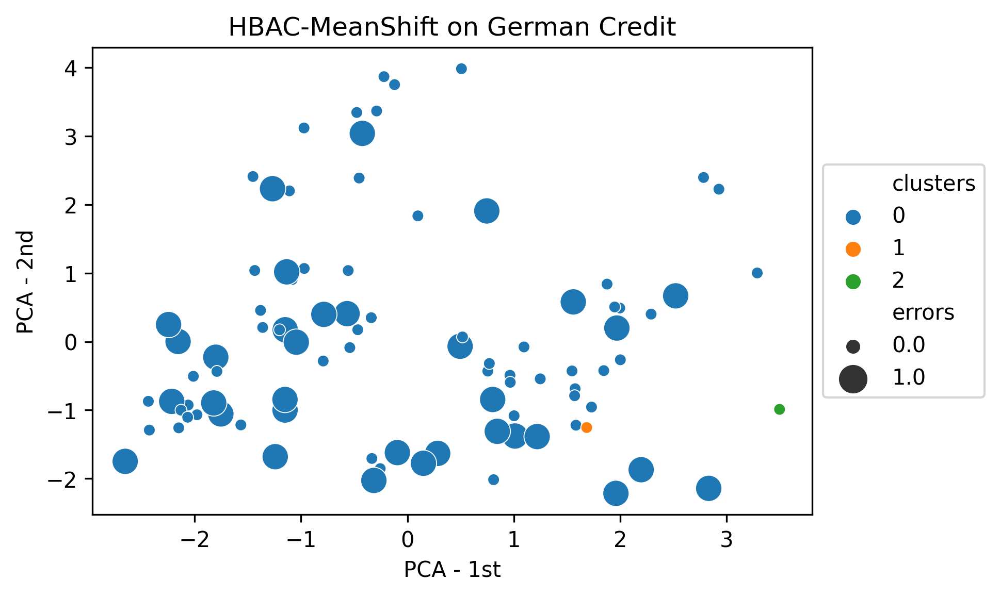

--> Cluster with the highest variance: 0
smallest cluster: 90


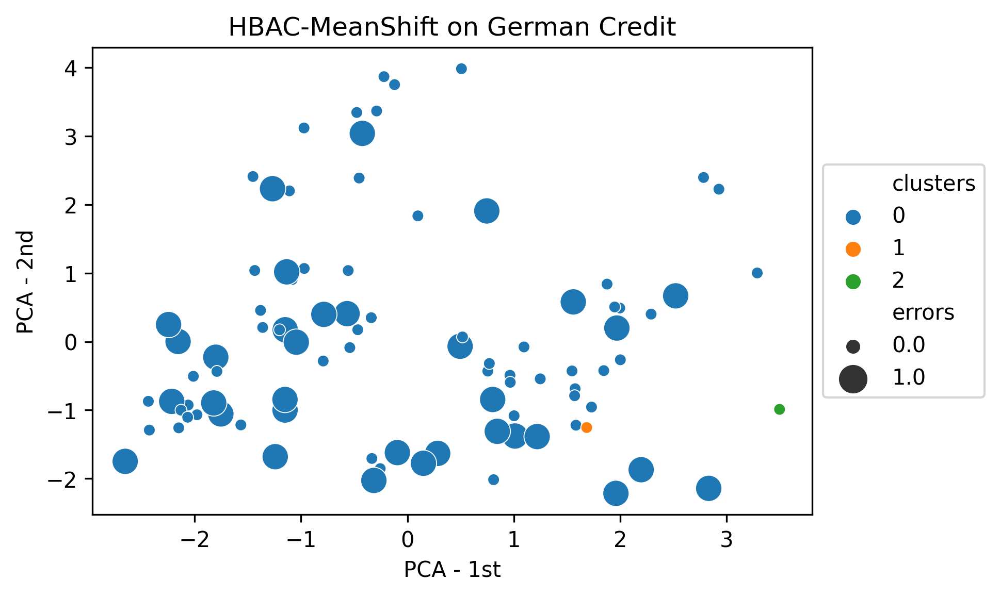

--> Cluster with the highest variance: 0
smallest cluster: 90


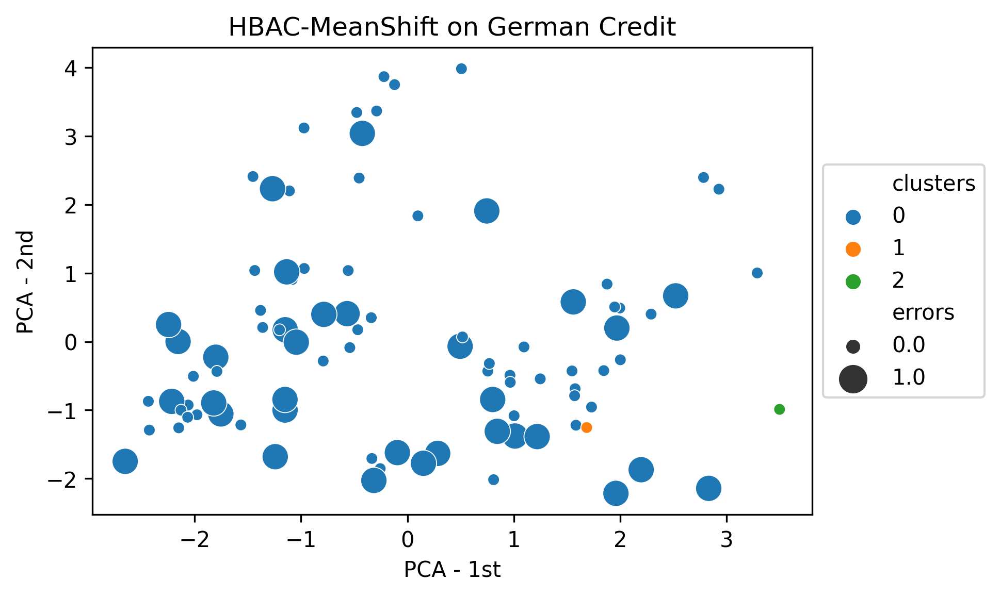

--> Cluster with the highest variance: 0
smallest cluster: 90


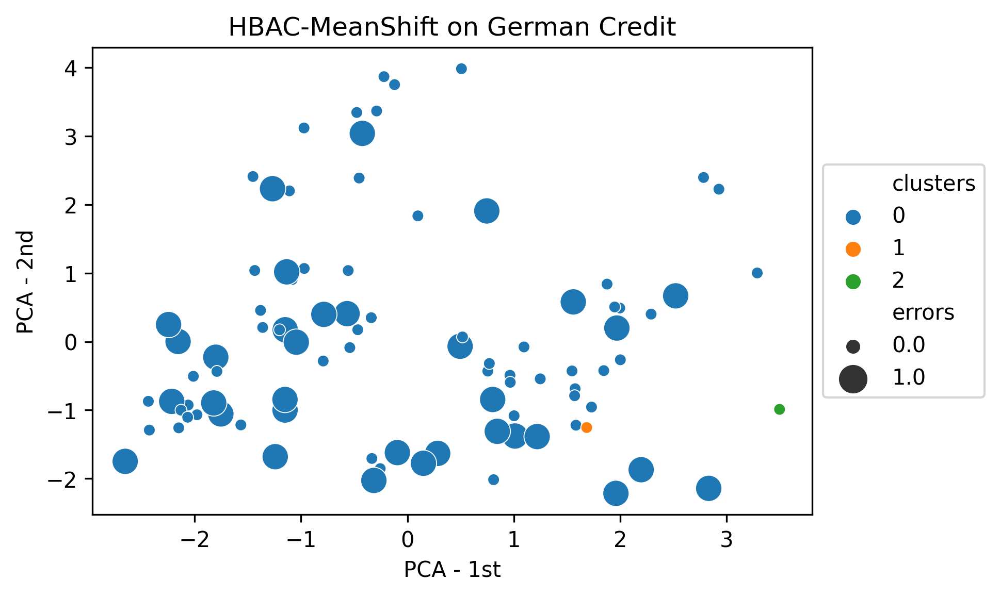

--> Cluster with the highest variance: 0
smallest cluster: 90


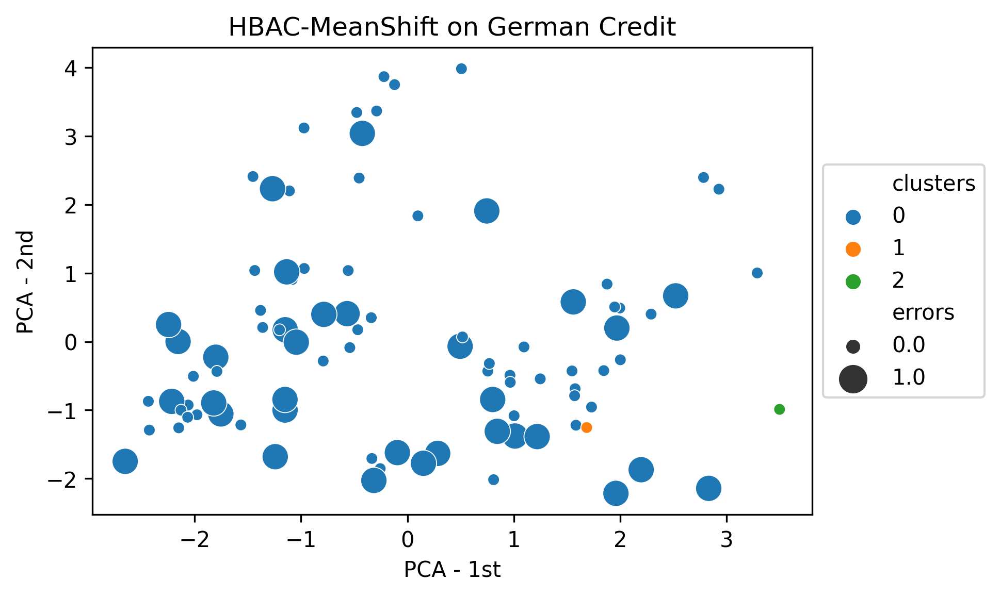

--> Cluster with the highest variance: 0
smallest cluster: 90


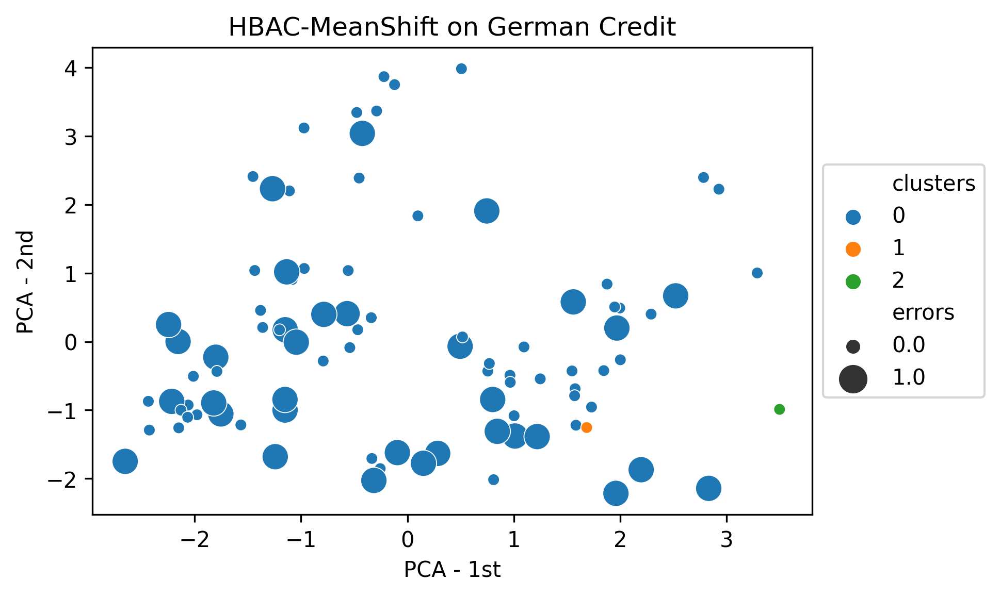

--> Cluster with the highest variance: 0
smallest cluster: 90


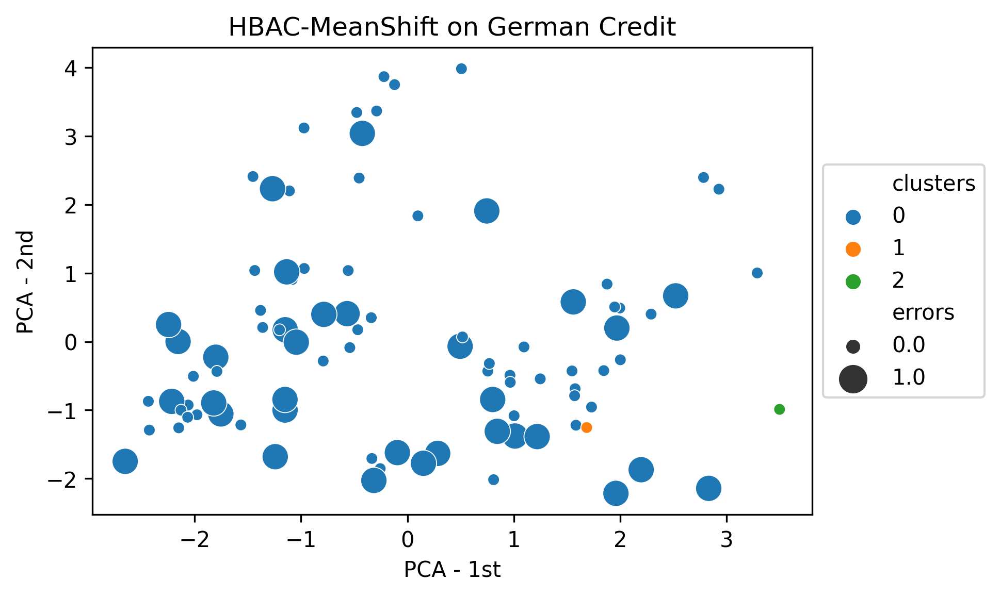

--> Cluster with the highest variance: 0
smallest cluster: 90


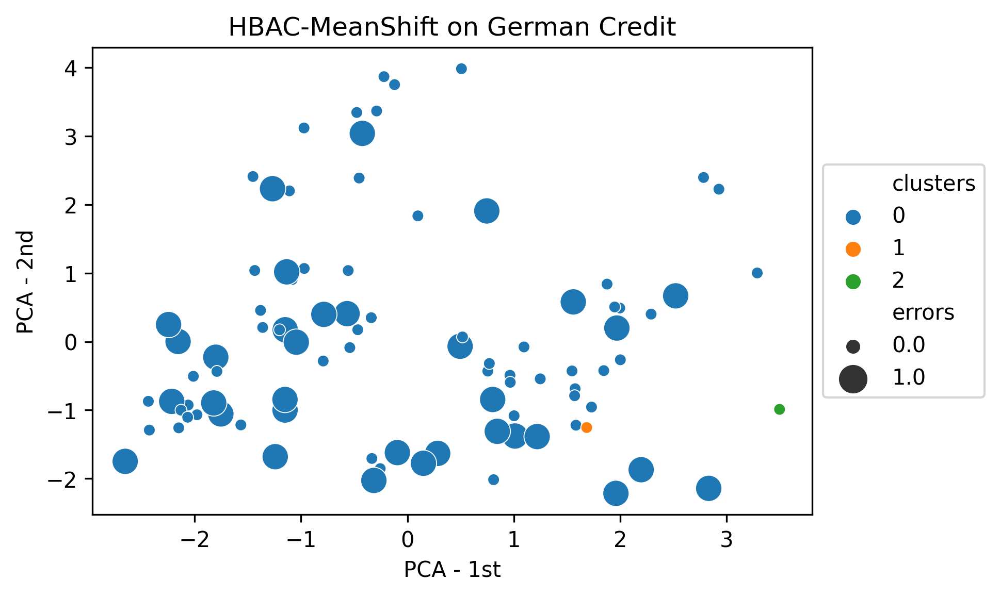

--> Cluster with the highest variance: 0
smallest cluster: 90


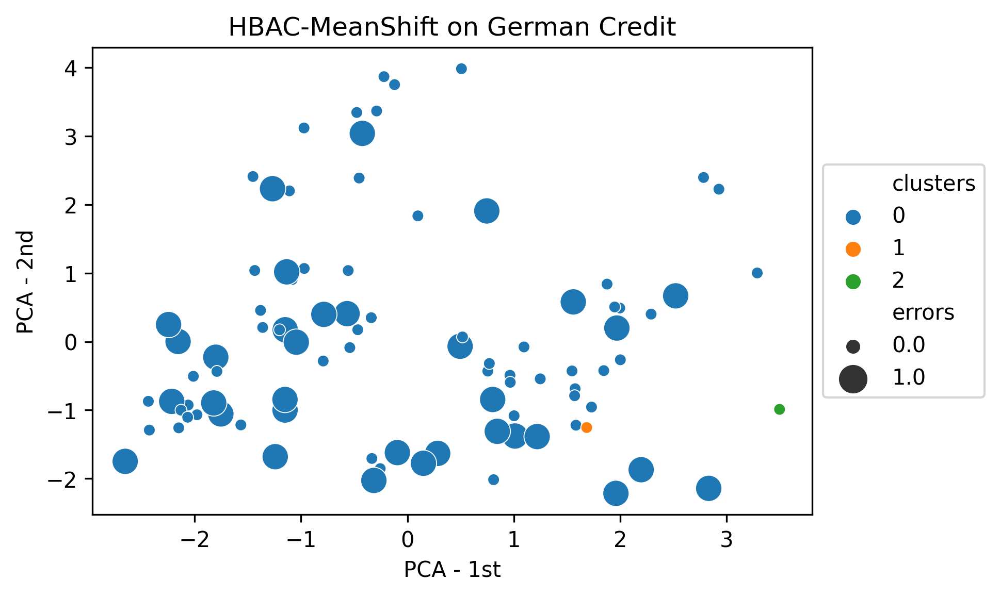

--> Cluster with the highest variance: 0
smallest cluster: 90


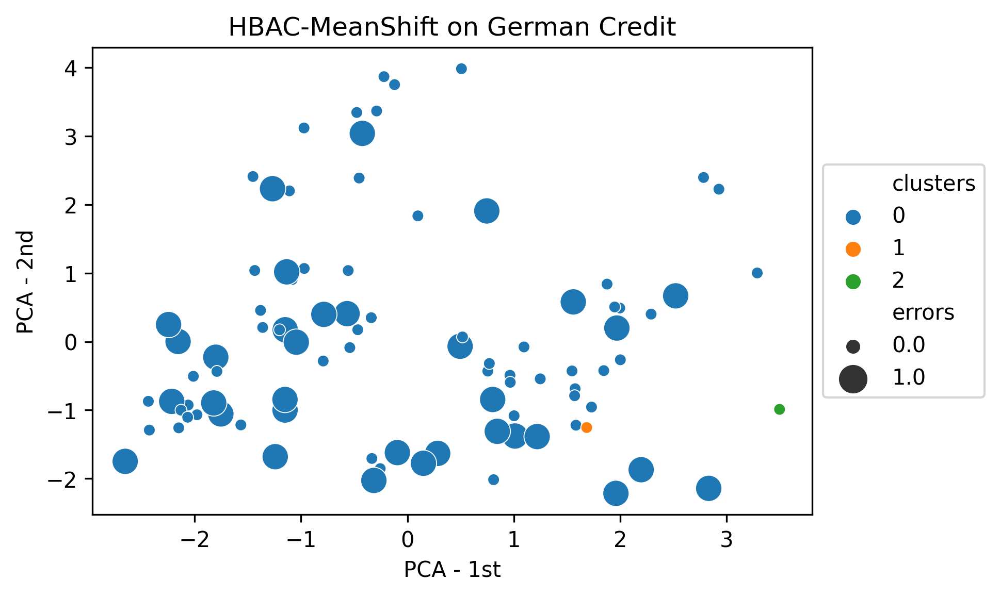

--> Cluster with the highest variance: 0
smallest cluster: 90


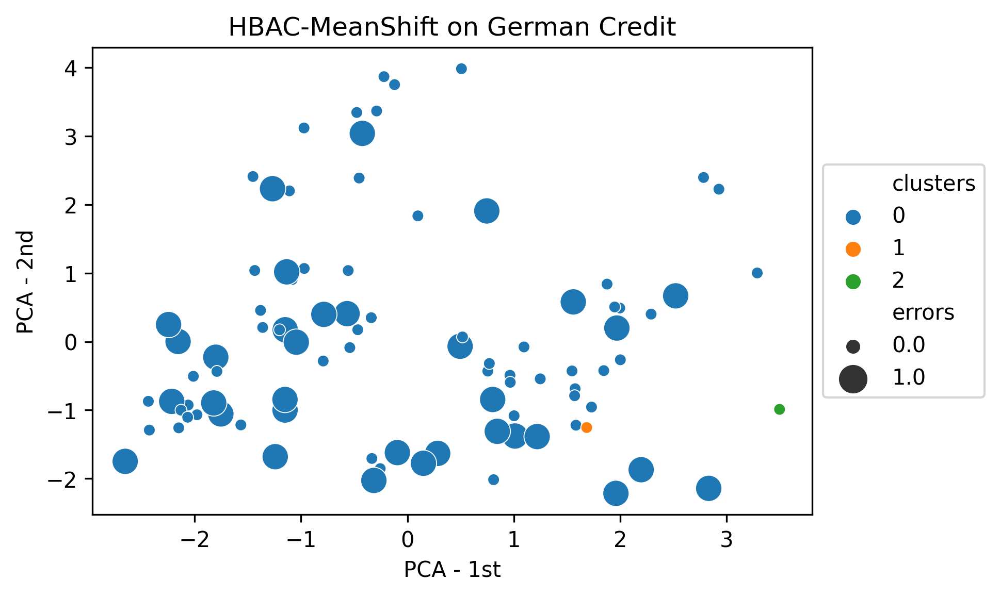

--> Cluster with the highest variance: 0
smallest cluster: 90


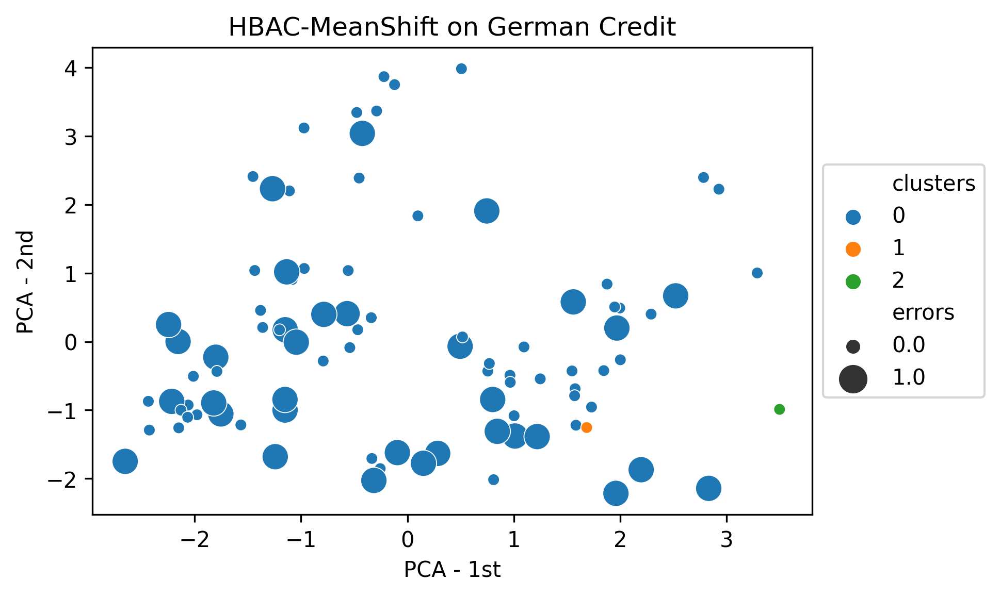

--> Cluster with the highest variance: 0
smallest cluster: 90


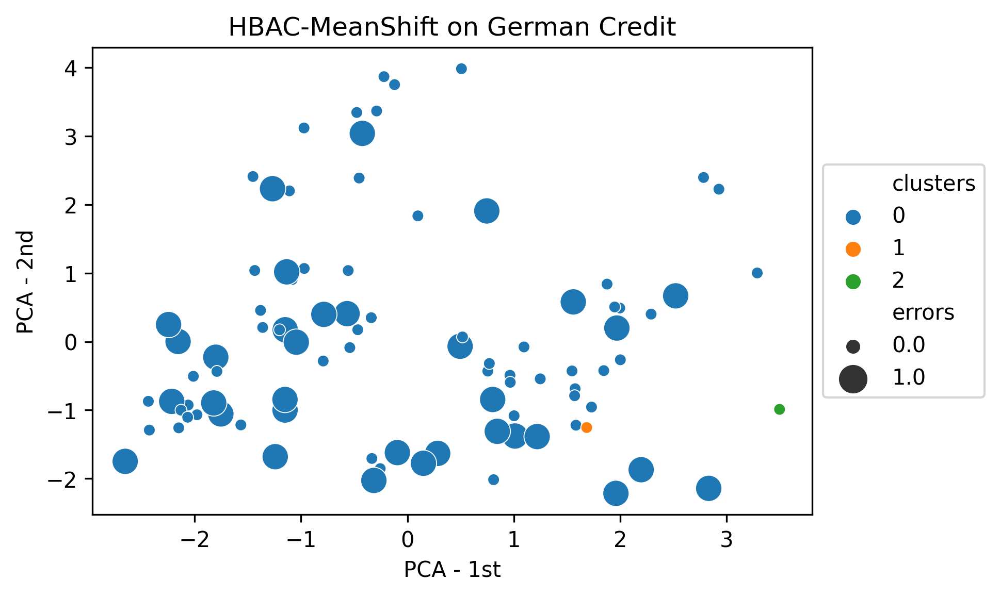

--> Cluster with the highest variance: 0
smallest cluster: 90


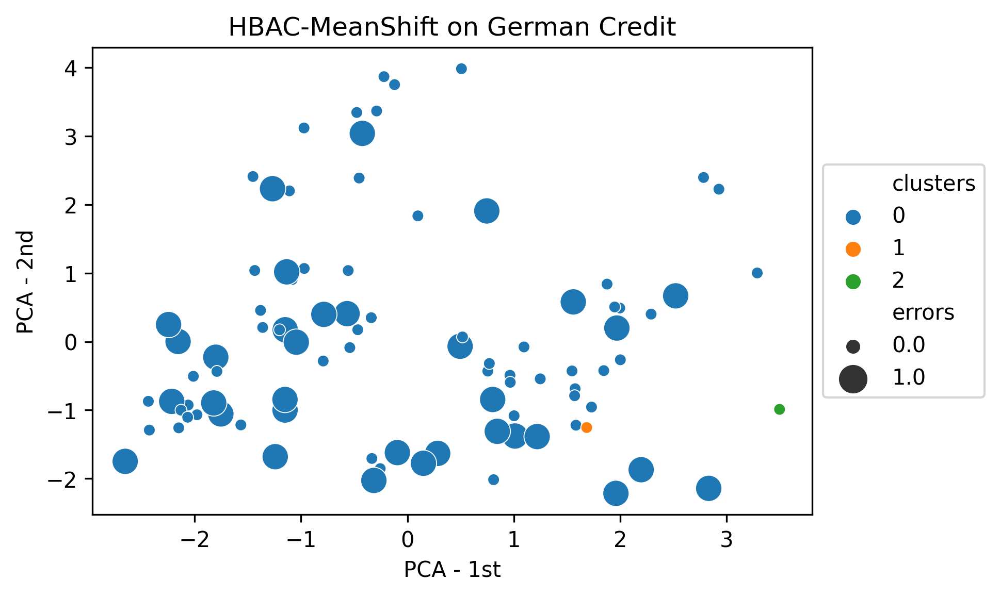

--> Cluster with the highest variance: 0
smallest cluster: 90


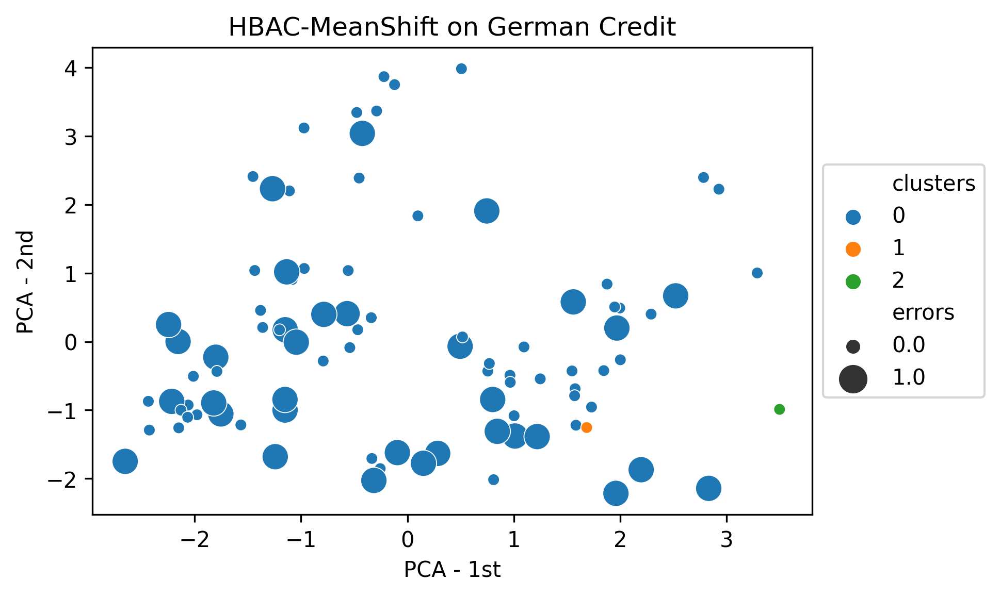

--> Cluster with the highest variance: 0
smallest cluster: 90


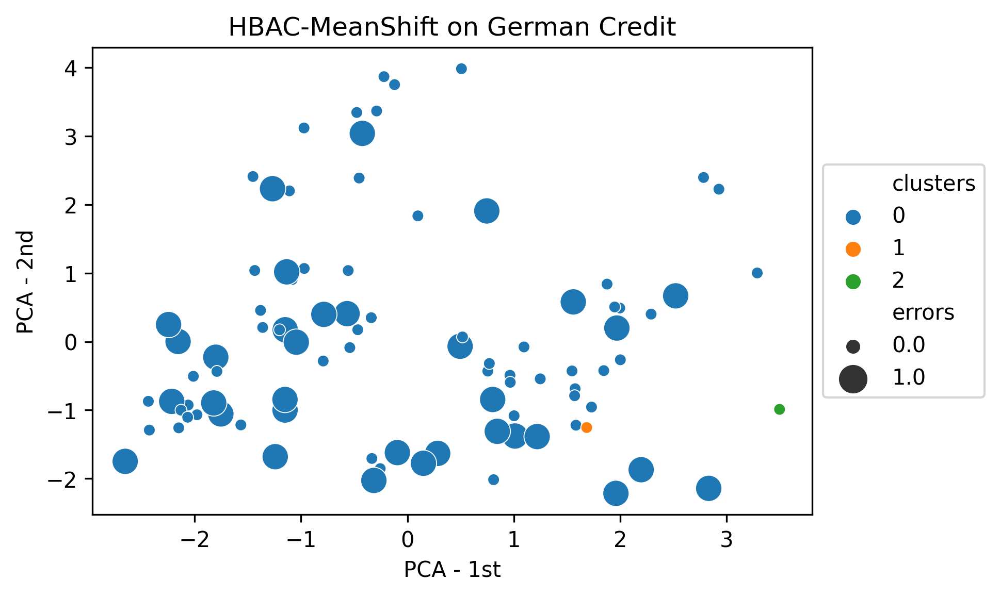

--> Cluster with the highest variance: 0
smallest cluster: 90


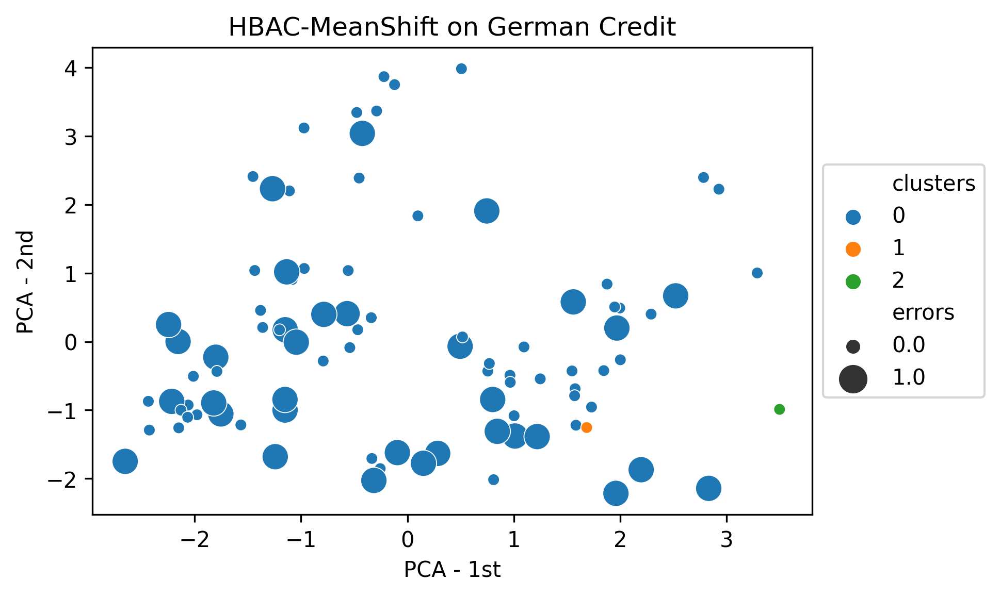

--> Cluster with the highest variance: 0
smallest cluster: 90


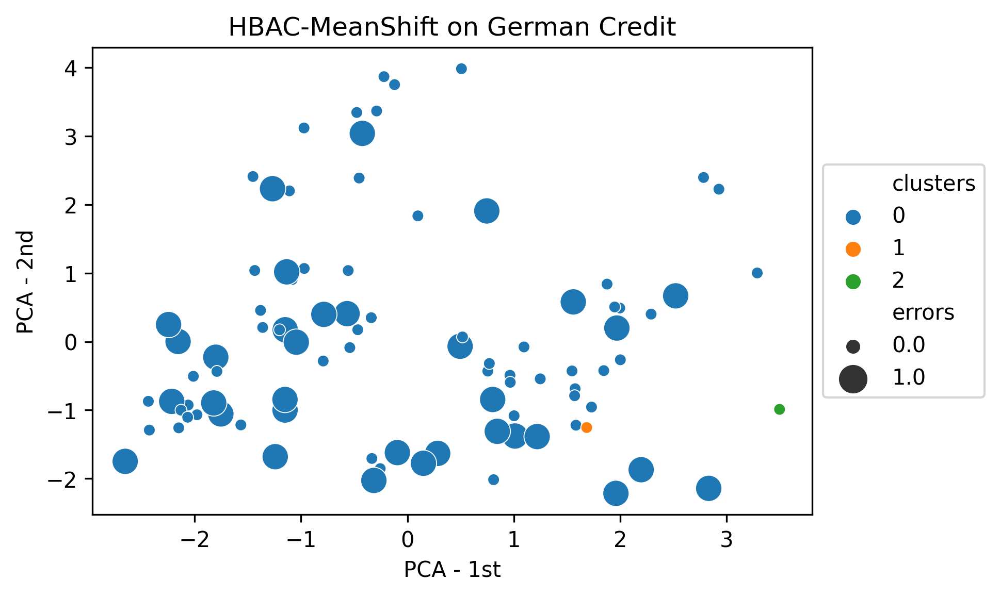

--> Cluster with the highest variance: 0
smallest cluster: 90


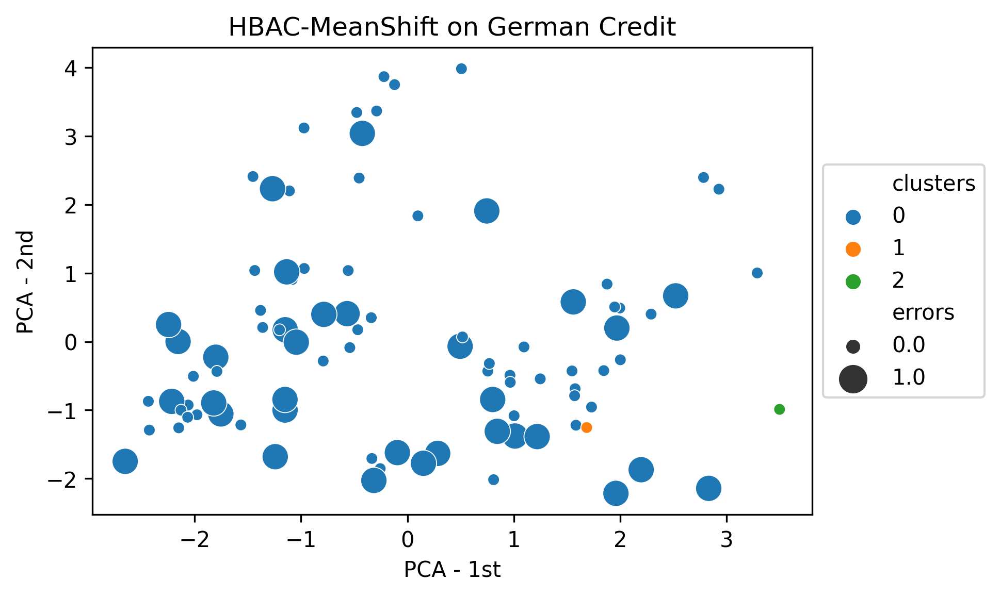

--> Cluster with the highest variance: 0
smallest cluster: 90


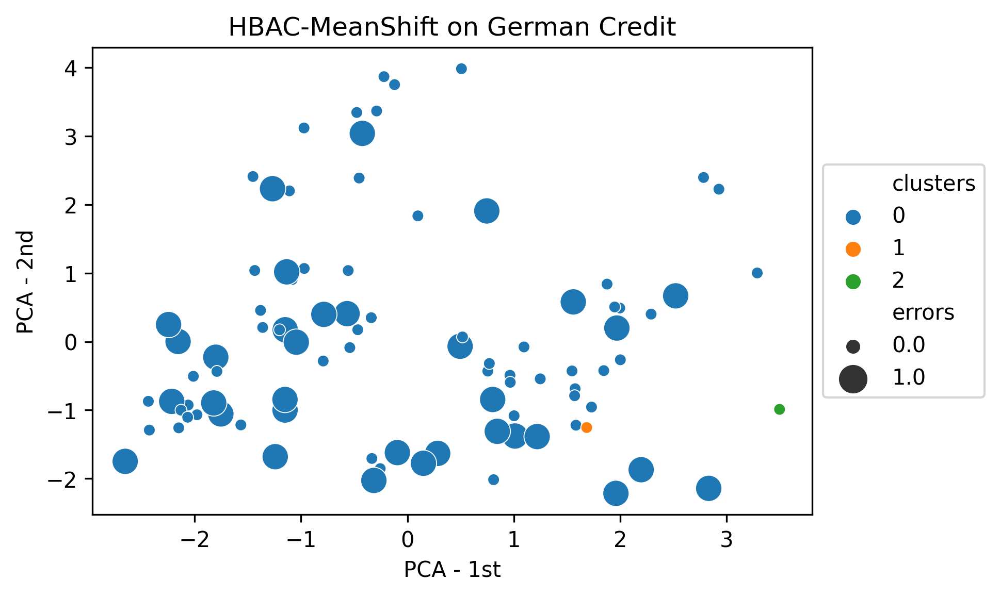

--> Cluster with the highest variance: 0
smallest cluster: 90


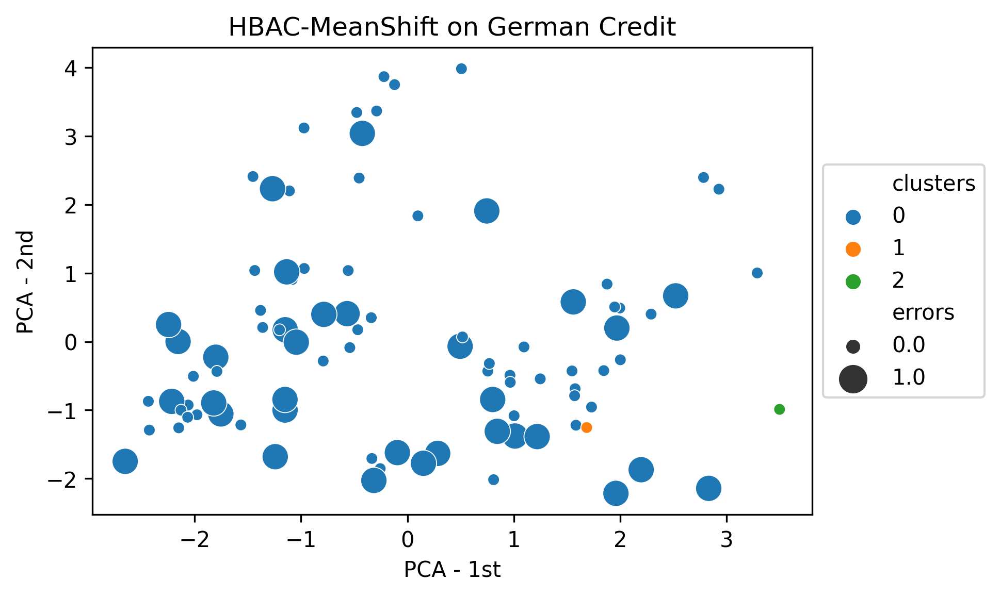

--> Cluster with the highest variance: 0
smallest cluster: 90


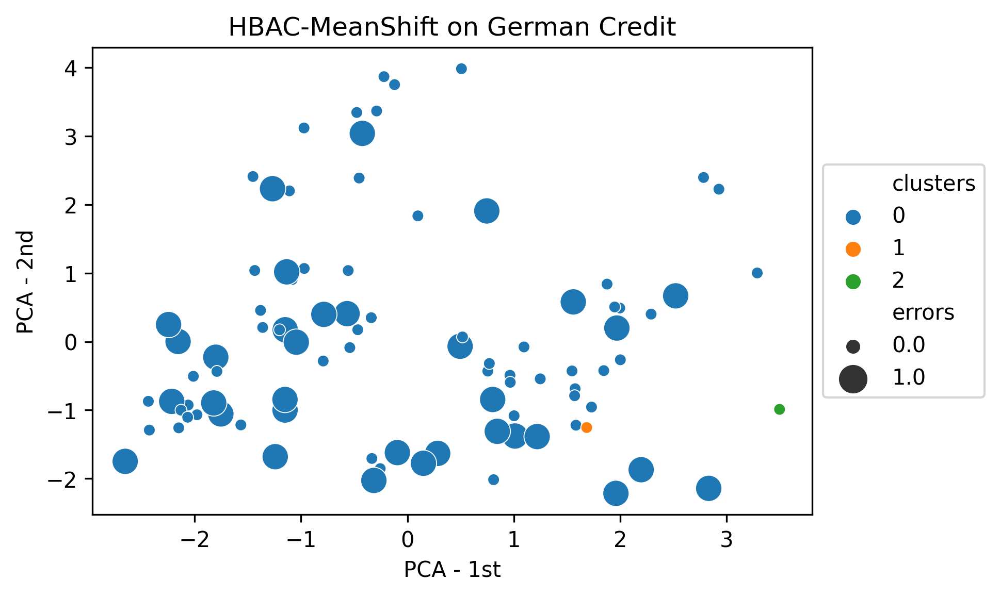

--> Cluster with the highest variance: 0
smallest cluster: 90


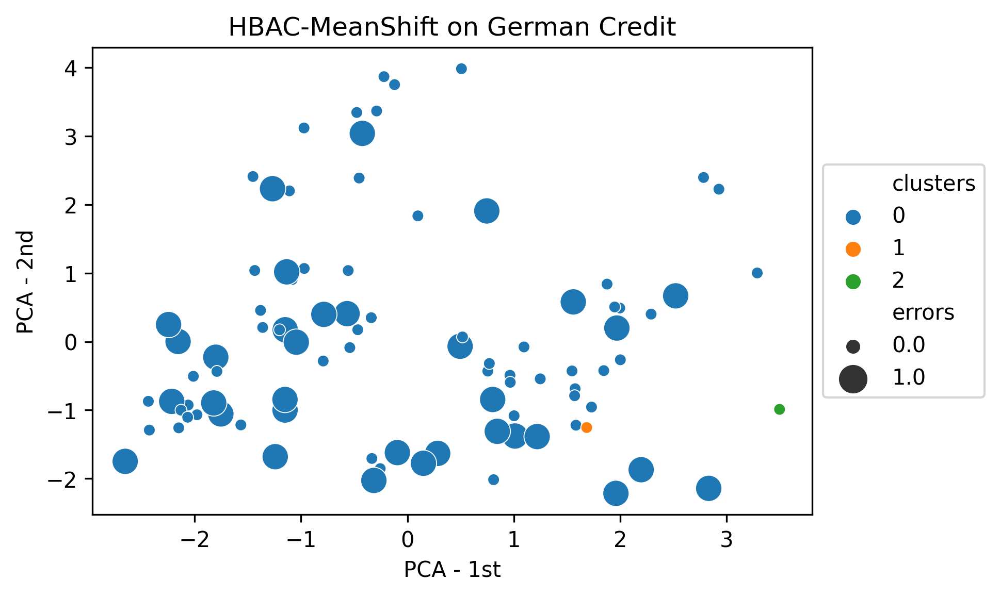

--> Cluster with the highest variance: 0
MAX_ITER
[0.13150585678058208, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539]


In [158]:
MAX_ITER = 30
x = 0 # cluster number
initial_bias = 0
bw1 = 8
# bw1 = estimate_bandwidth(bandwidth_features)
# print('estimated bandwidth: ', bw1)
pca_plot(full_data)
variance_list = []
average_accuracy = accuracy(full_data) 
minimal_splittable_cluster_size = round(0.03 * len(full_data))
minimal_acceptable_cluster_size = round(0.01 * len(full_data))
print("average_accuracy is: ", average_accuracy) 


for i in range(1, MAX_ITER):
    print('This is the current cluster: ', x)
    if i != 1:
        variance_list.append(calculate_variance(full_data)) 
    full_data['new_clusters'] = -1
    candidate_cluster = full_data.loc[full_data['clusters'] == x] 

    if len(candidate_cluster) < minimal_splittable_cluster_size:
        x = get_random_cluster(full_data['clusters'])
        continue
    
    # Apply MeanShift
    candidate_cluster['new_clusters'] = pd.DataFrame(MeanShift(bandwidth=bw1).fit_predict(candidate_cluster.drop(['clusters', 'new_clusters', 'predicted_class','true_class', 'errors'], axis=1)), index=candidate_cluster.index)

    full_data['new_clusters'] = candidate_cluster['new_clusters'].combine_first(full_data['new_clusters']) 

    max_neg_bias = get_max_negative_bias(full_data) #get max abs bias
    min_new_size = get_min_cluster_size(full_data)
    print("smallest cluster:",min_new_size)
    if (max_neg_bias <= initial_bias) & (min_new_size >= minimal_acceptable_cluster_size): 
        # Add new cluster
        n_cluster = max(full_data['clusters'])
        full_data['clusters'][full_data['new_clusters'] == 1] =  n_cluster + 1
        
        pca_plot(full_data)
        x = get_next_cluster(full_data)
        initial_bias = max_neg_bias
    else:
        x = get_random_cluster(full_data['clusters'])
        
print('MAX_ITER')

print(variance_list)

## 3. Mean-Shift Results

In [116]:
# Goal 1: Identifying highest biased cluster
c = get_max_bias_cluster(full_data)
print(f"cluster {c} has the highest negative bias")
print(full_data['clusters'].unique())
highest_biased_cluster = full_data[full_data['clusters']==c]
len(highest_biased_cluster)

accuracy_full_data = accuracy(full_data)
print('Overall accuracy:', accuracy_full_data)

most_biased_cluster_meanshift_aware = bias_acc(full_data, c, 'clusters')

full_data[full_data['clusters']==c]
print('Highest found negative bias:', most_biased_cluster_meanshift_aware)

0 has bias 0.25833333333333336
2 has bias 0.3666666666666667
1 has bias -0.6555555555555556
4 has bias -0.1444444444444445
5 has bias -0.1444444444444445
3 has bias -0.1444444444444445
7 has bias -0.6483516483516484
6 has bias -0.6483516483516484
cluster 1 has the highest negative bias
[0 2 1 4 5 3 7 6]
Overall accuracy: 0.6413043478260869
Highest found negative bias: -0.6555555555555556


In [ ]:
discriminated_cluster = full_data[full_data['clusters']==c]
print('Number of instances in discriminated cluster:', len(discriminated_cluster))
print('Number of errors in discriminated clusters: ', len(discriminated_cluster.loc[discriminated_cluster['errors']==1]))
discriminated_cluster

In [ ]:
variance_df = pd.DataFrame(variance_list).rename(columns={0:"variance incl errors"})
sns.lineplot(data=variance_df, x=variance_df.index,y="variance incl errors")

## Baseline Mean Shift

In [161]:
full_data = initialize_dataset(raw_data)
bandwidth_features = full_data.iloc[: , : 25]
# bandwidth_features = full_data.iloc[: , : 14]

In [147]:
# full_data['scaled_errors'].replace(0.8, 800)

136      0.0
76     800.0
280      0.0
174    800.0
210      0.0
       ...  
290      0.0
211    800.0
227    800.0
7      800.0
155      0.0
Name: scaled_errors, Length: 92, dtype: float64

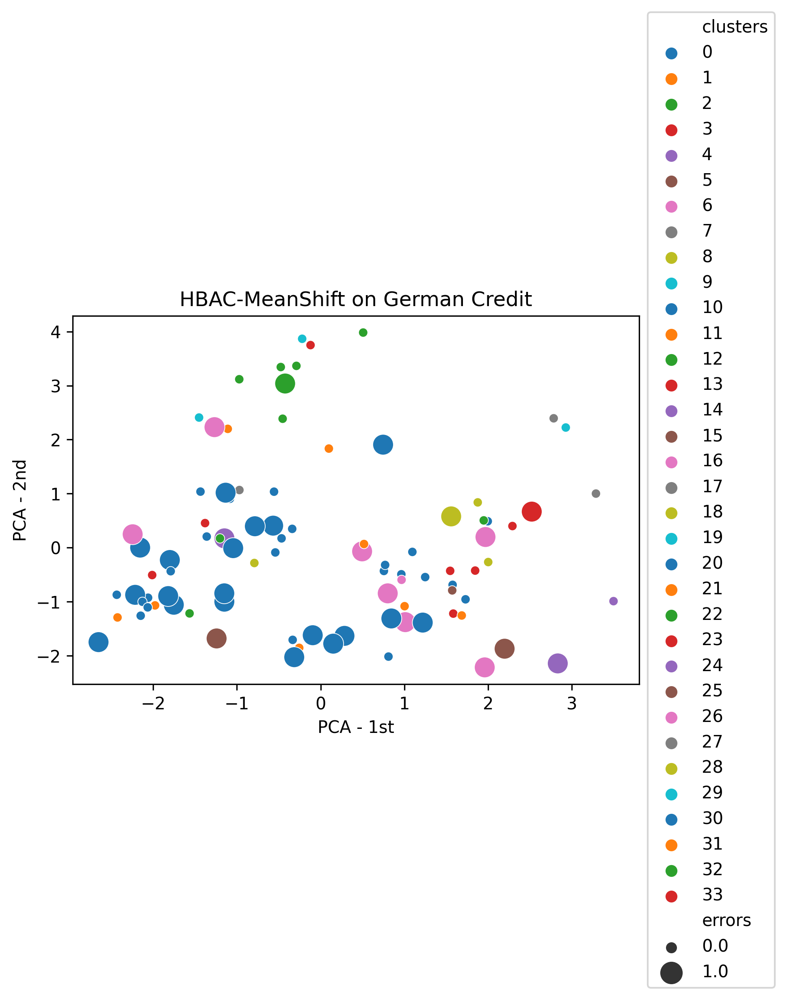

In [168]:
# bw1 = estimate_bandwidth(bandwidth_features)
full_data['clusters'] = pd.DataFrame(MeanShift(bandwidth=4).fit_predict(full_data.drop(['clusters', 'new_clusters', 'predicted_class', 'true_class', 'errors'], axis=1)), index=full_data.index)
pca_plot(full_data)

In [ ]:
# Goal 1: Identifying highest biased cluster
c = get_max_bias_cluster(full_data)
print(f"cluster {c} has the highest negative bias")
print(full_data['clusters'].unique())
highest_biased_cluster = full_data[full_data['clusters']==c]
len(highest_biased_cluster)

accuracy_full_data = accuracy(full_data)
print('Overall accuracy:', accuracy_full_data)

most_biased_cluster_baselinemeanshift = bias_acc(full_data, c, 'clusters')

full_data[full_data['clusters']==c]
print('Highest found negative bias:', most_biased_cluster_baselinemeanshift)

## Goal 1: Comparing Bias-Aware KMeans/DBSCAN/MeanShift with finding the highest negatively biased cluster

In [150]:
results_array = []

# the minus is to make the values positive, as that makes it easier to find the highest negative biased cluster
results_array.append(-most_biased_cluster_kmeans_aware)
results_array.append(-most_biased_cluster_dbscan_aware)
results_array.append(-most_biased_cluster_meanshift_aware)
results_array.append(-most_biased_cluster_baselinekm)
results_array.append(-most_biased_cluster_baselinemeanshift)


plt.bar(['KMeans', 'DBSCAN', 'MeanShift', 'BaselineKM', 'BaselineMeanShift'], results_array)


NameError: name 'most_biased_cluster_baselinekm' is not defined

Debugging

In [169]:
full_data = initialize_dataset(raw_data)
# bandwidth_features = full_data.iloc[: , : 14]
bandwidth_features = full_data.iloc[: , : 25]
bandwidth_features.head()
estimate_bandwidth(bandwidth_features)

5.887950738601325

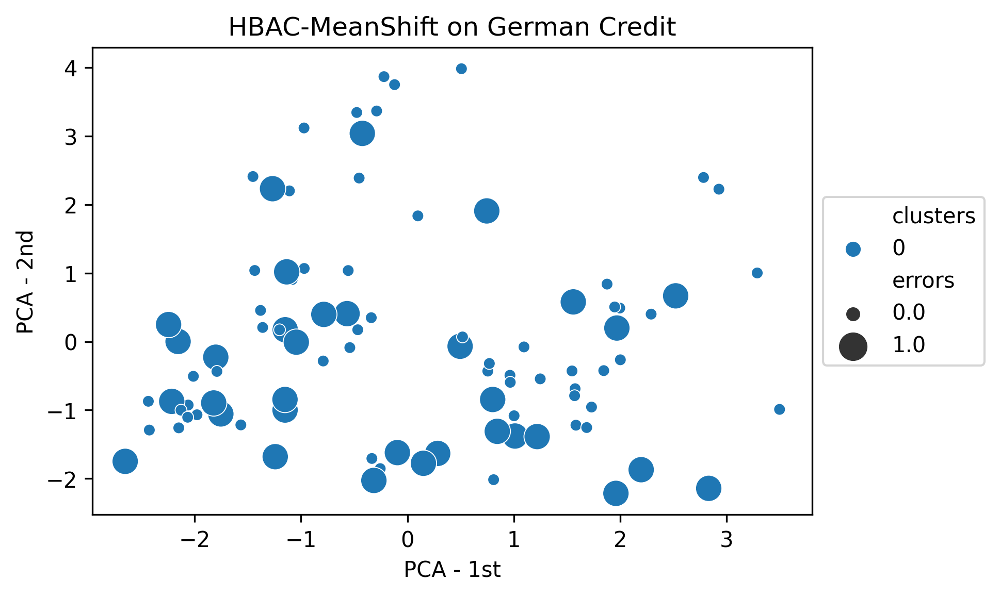

average_accuracy is:  0.6413043478260869
This is the current cluster:  0
smallest cluster: 1


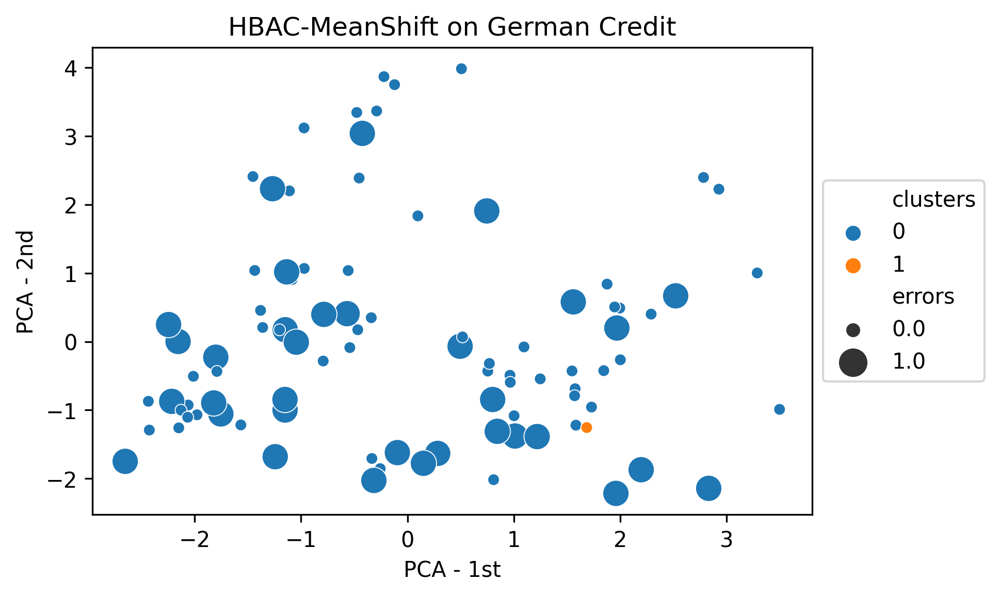

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 1


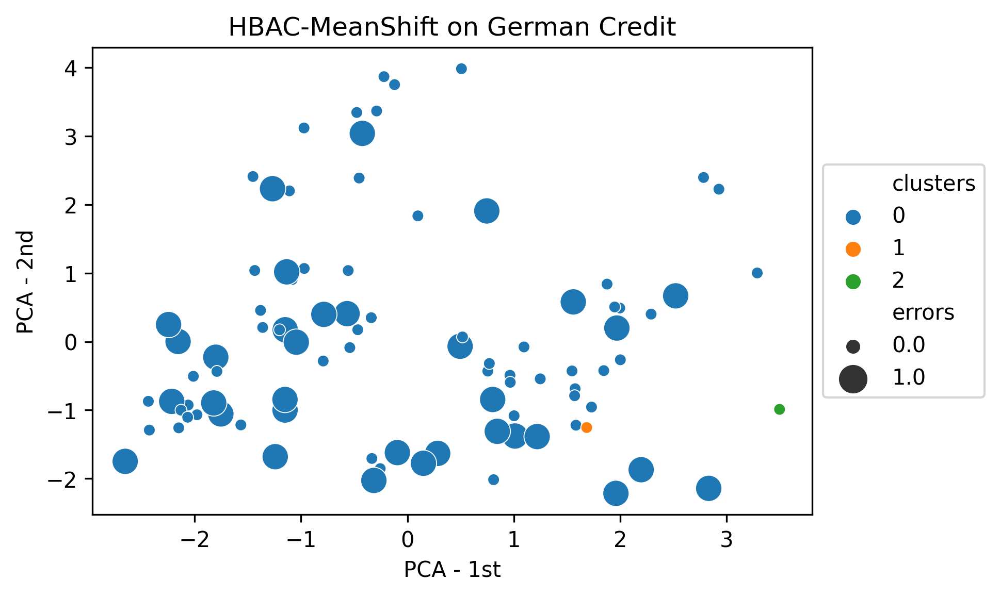

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


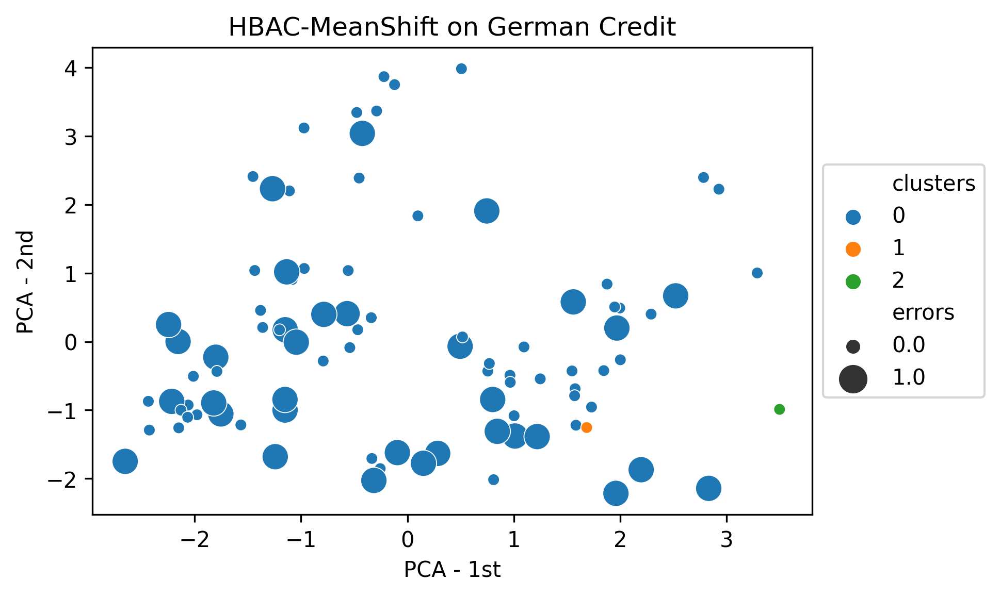

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


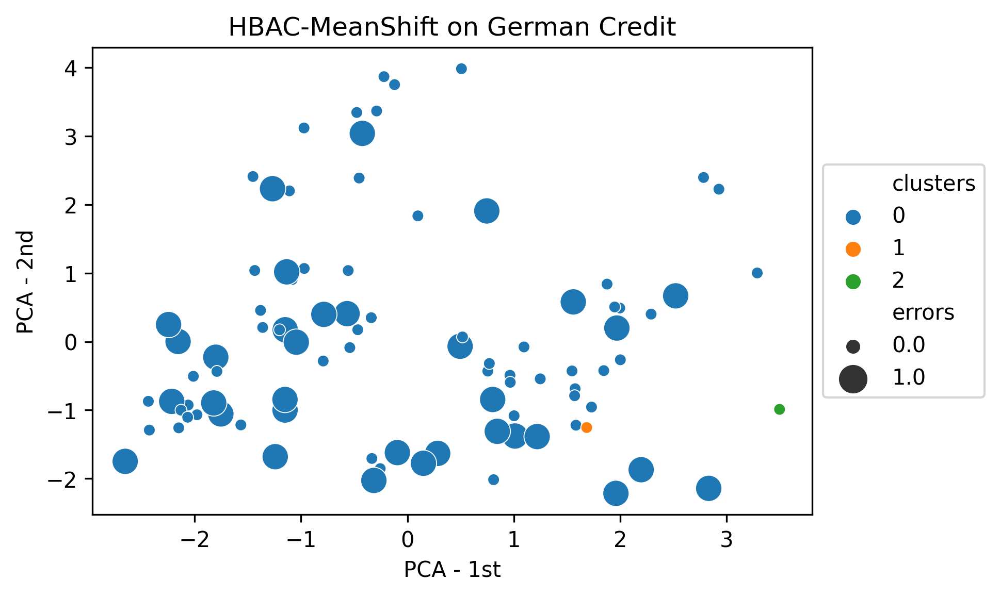

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


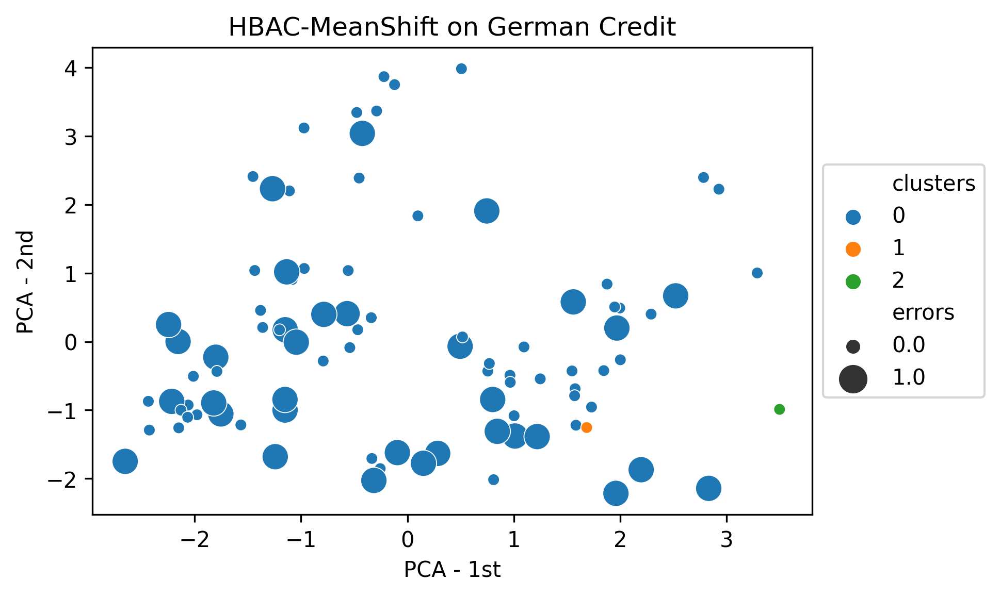

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


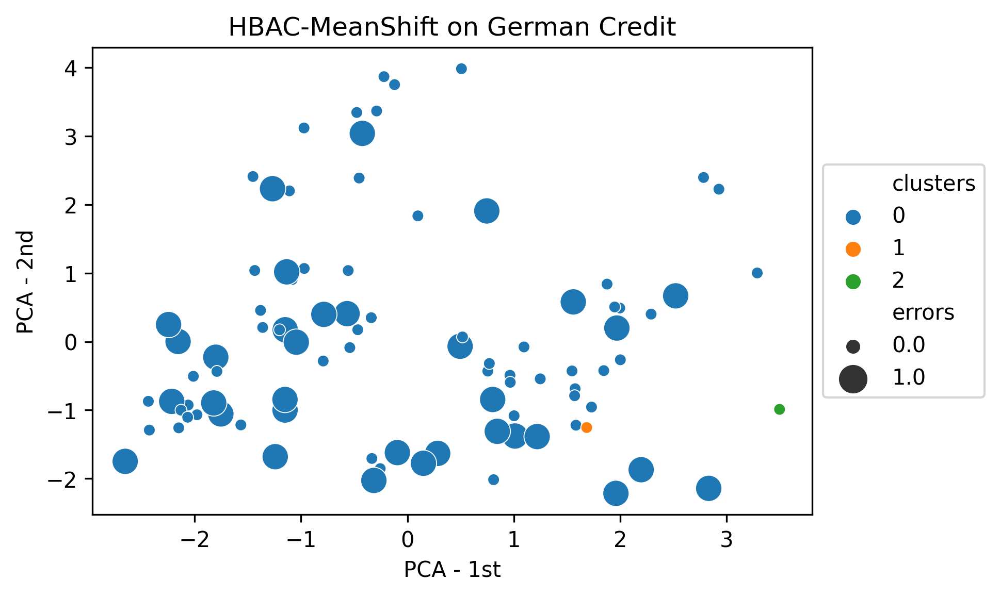

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


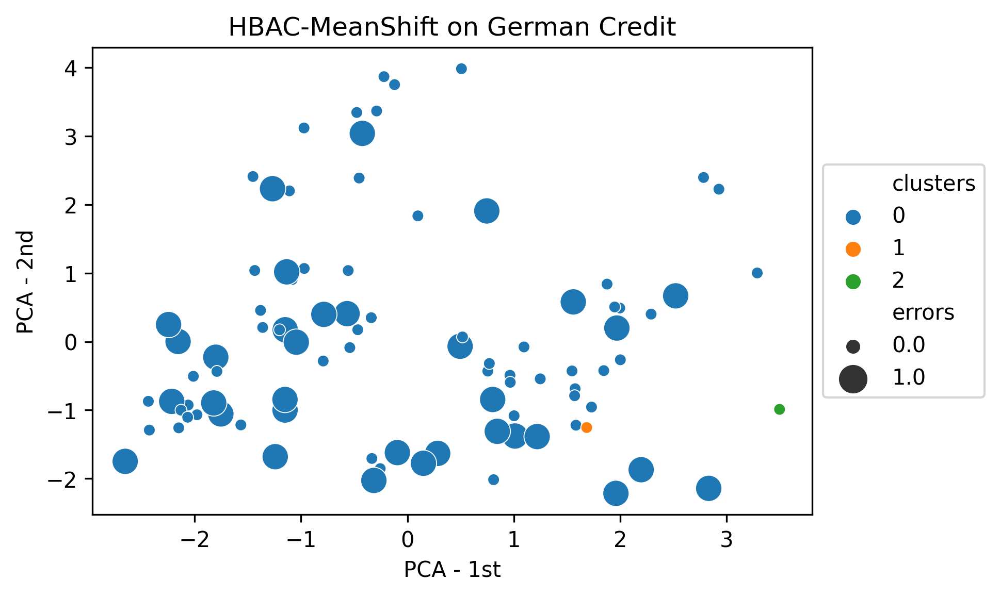

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


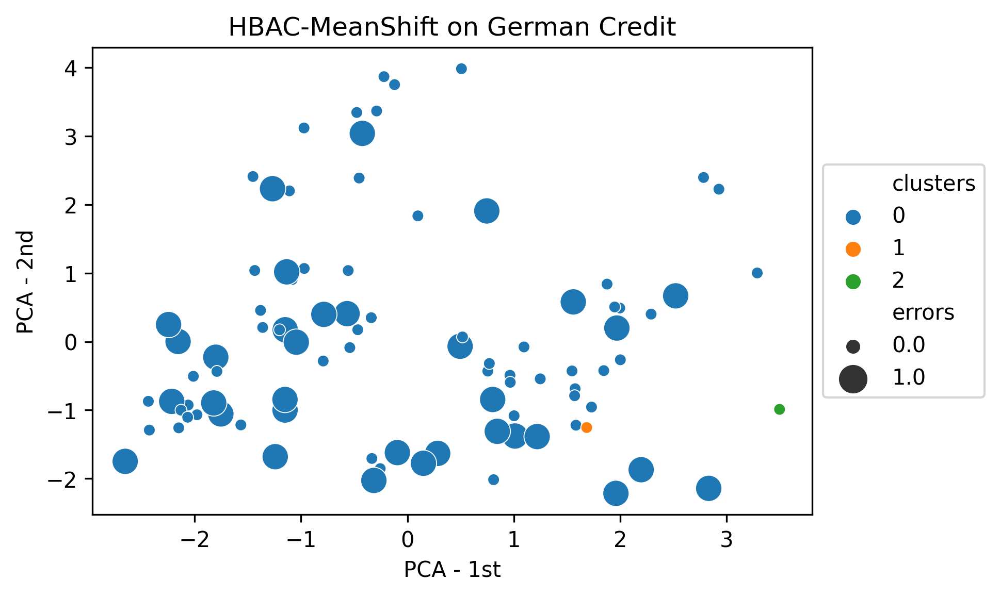

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


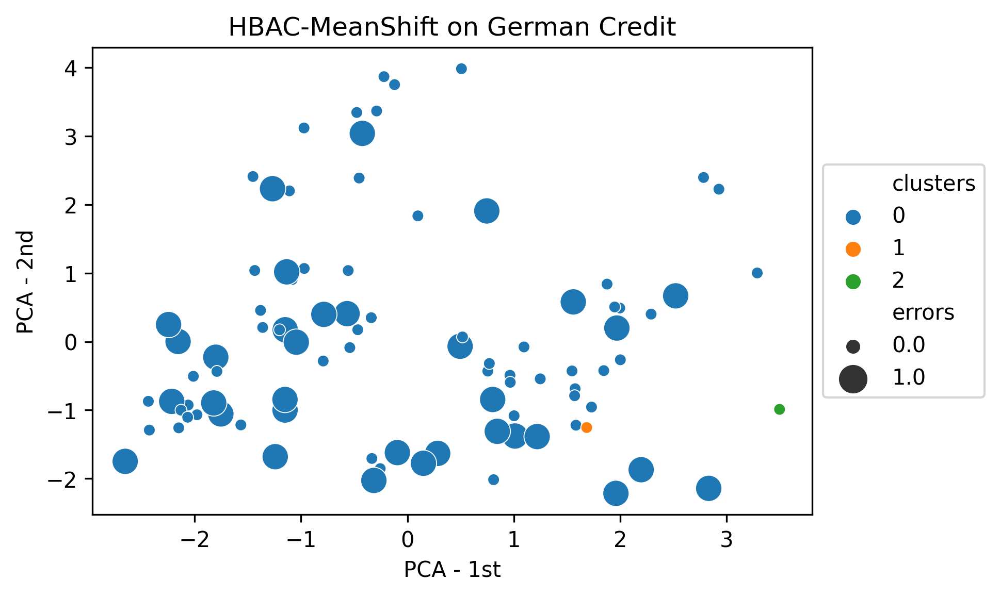

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


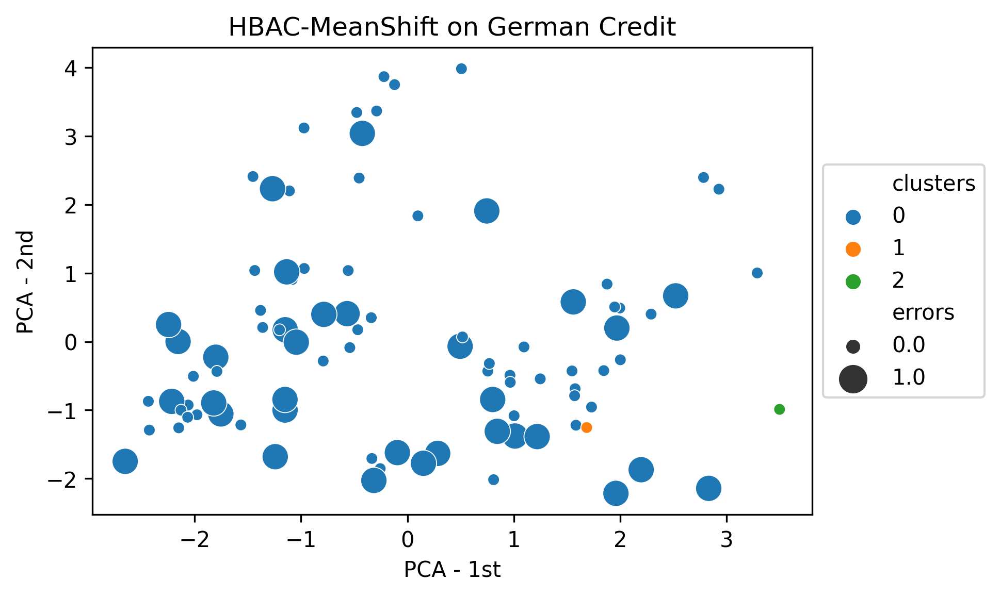

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


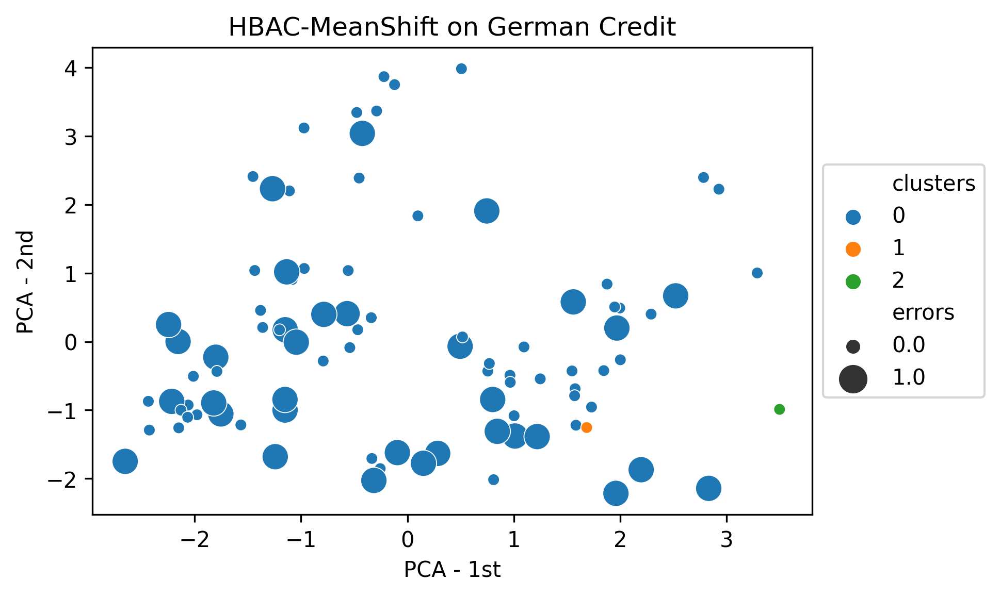

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


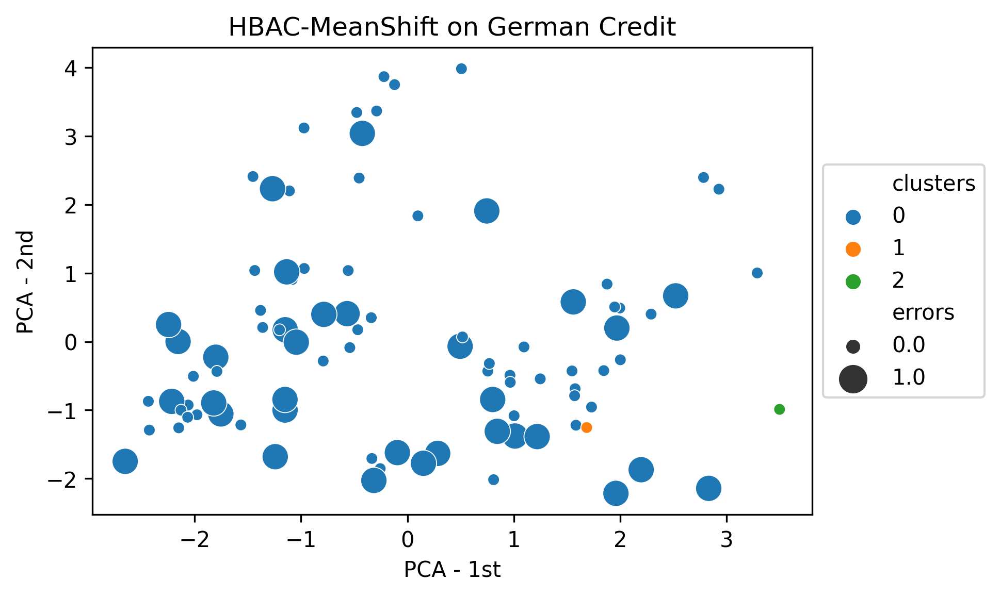

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


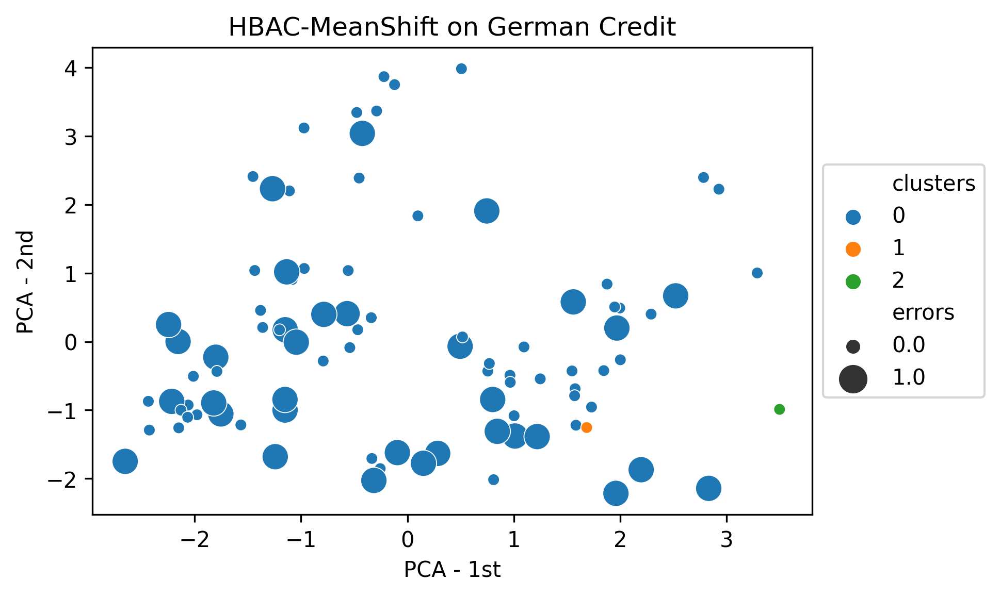

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


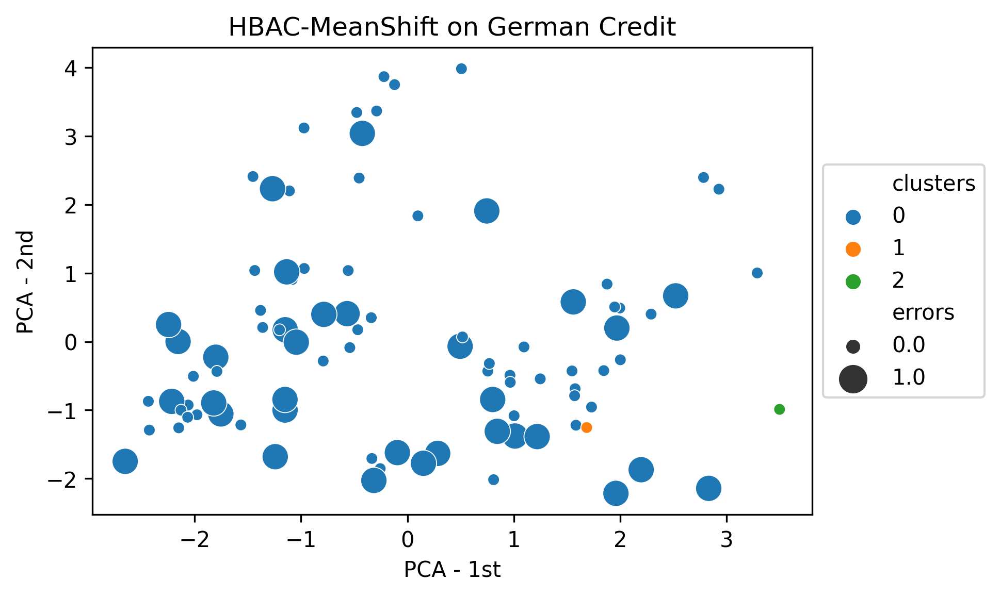

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


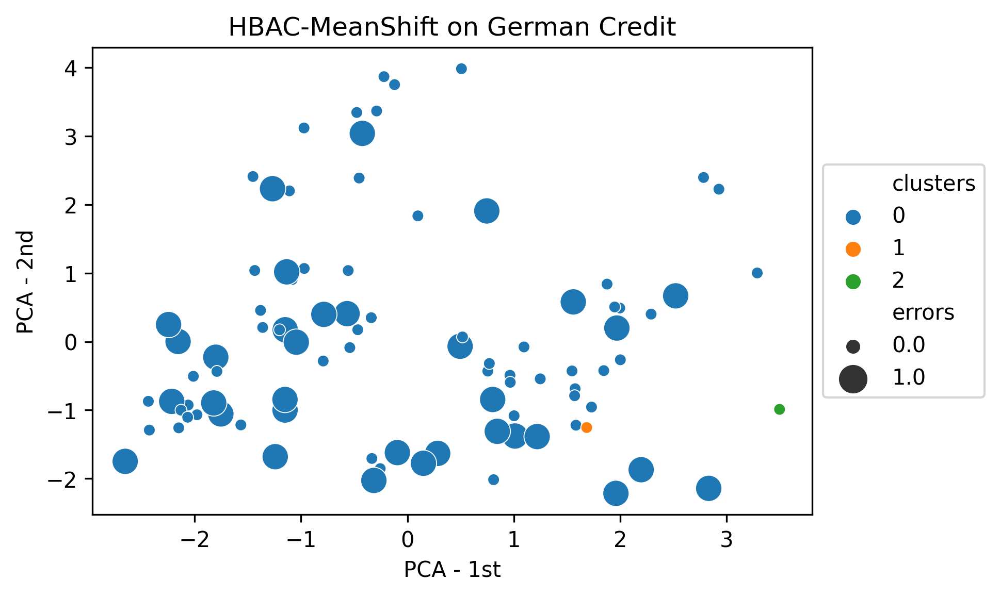

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


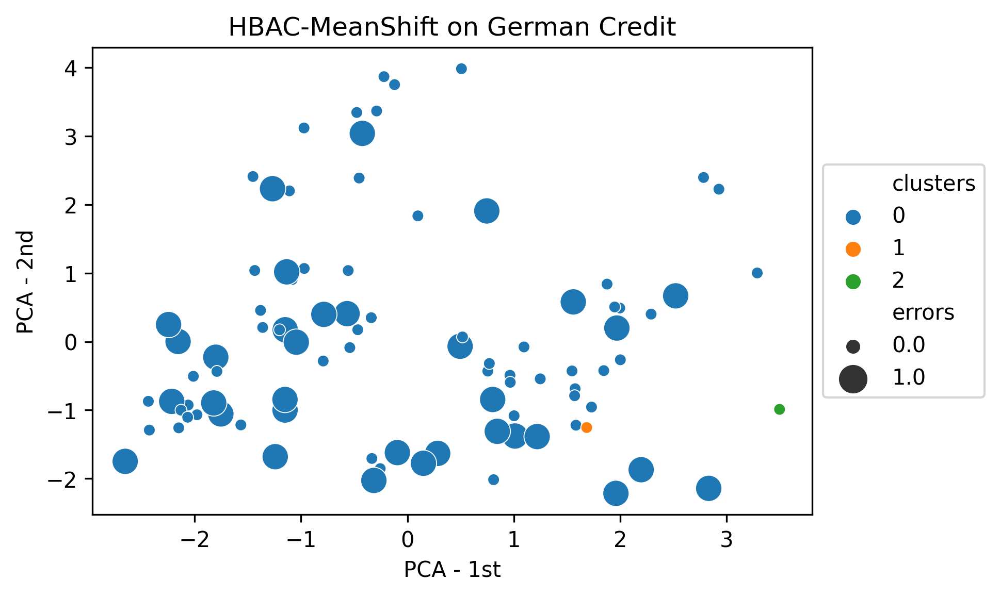

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


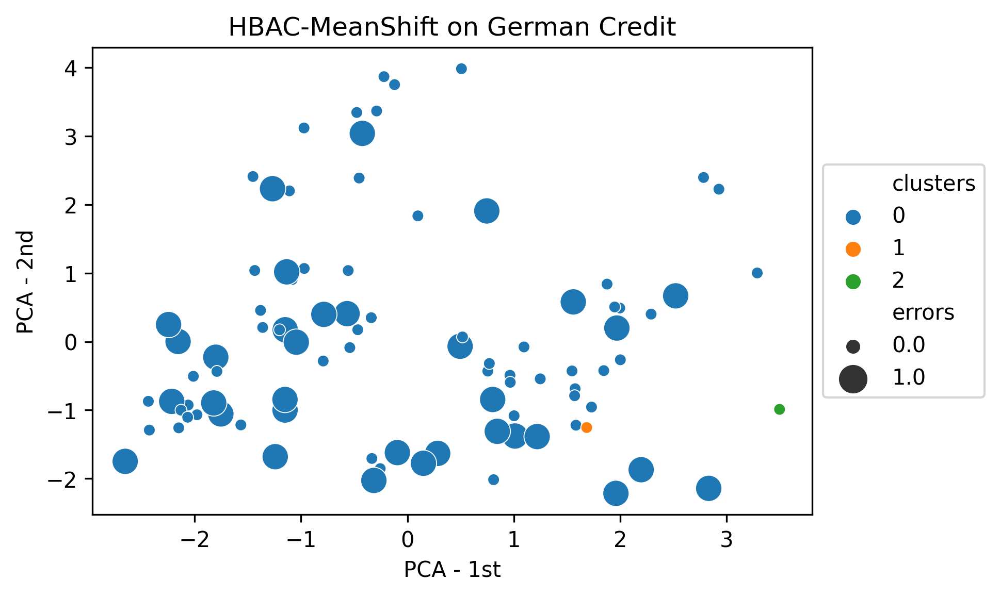

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


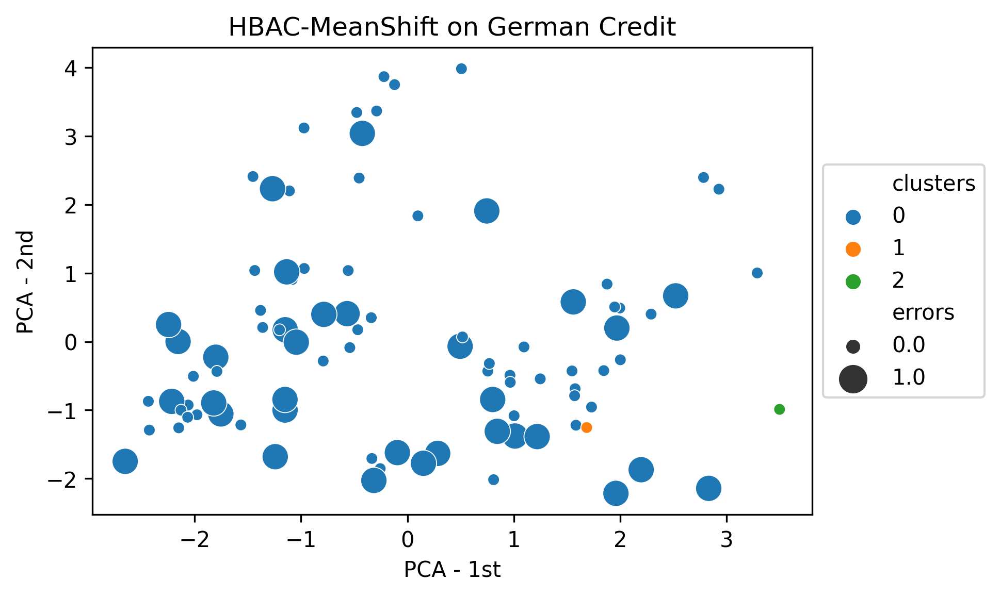

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


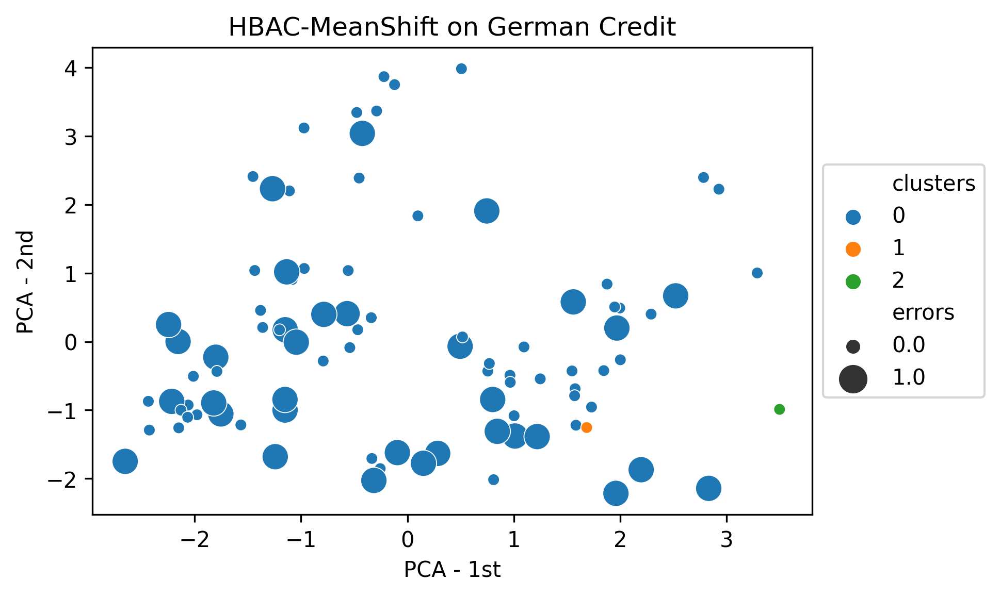

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


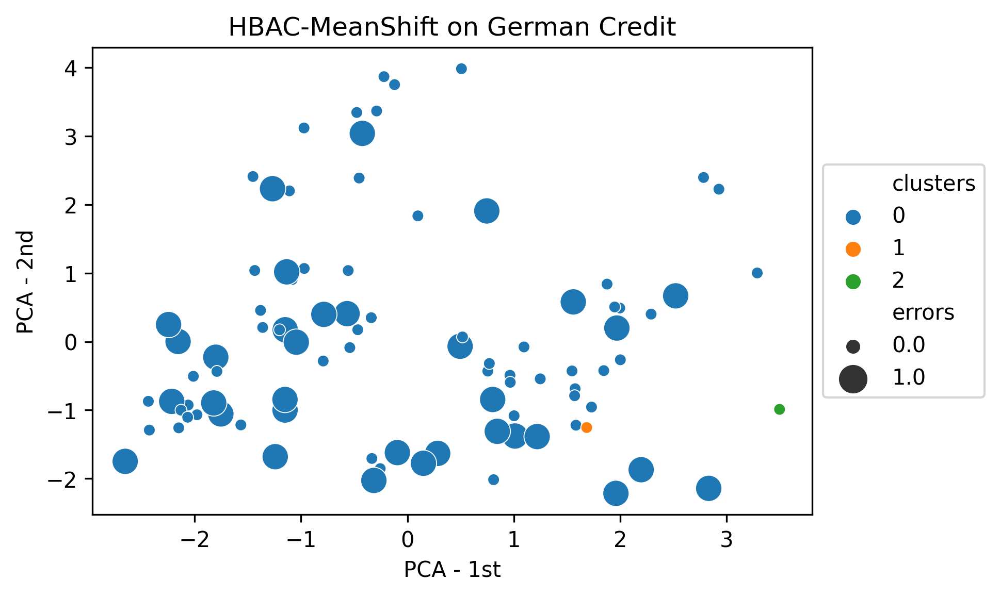

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


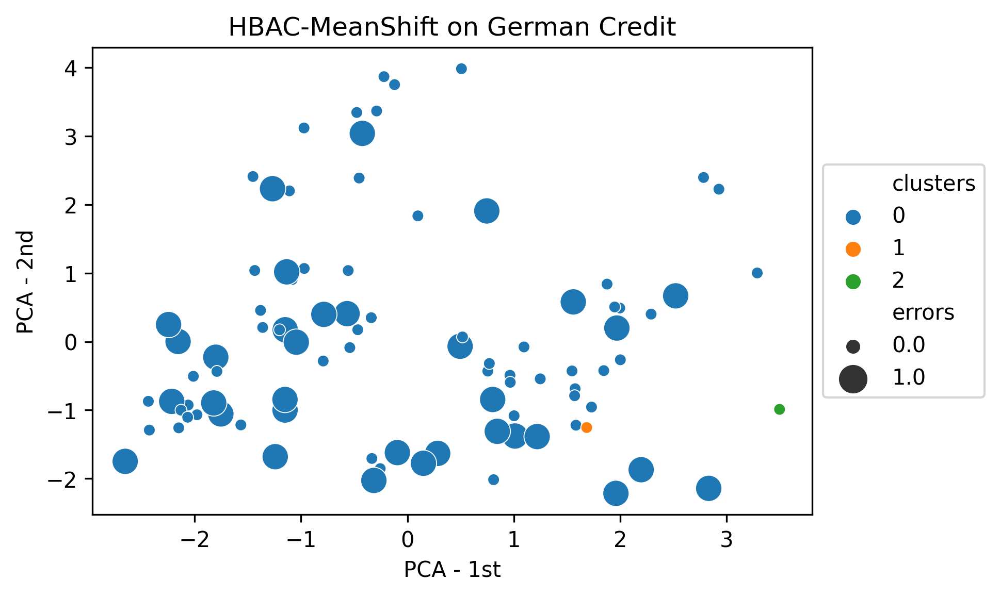

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


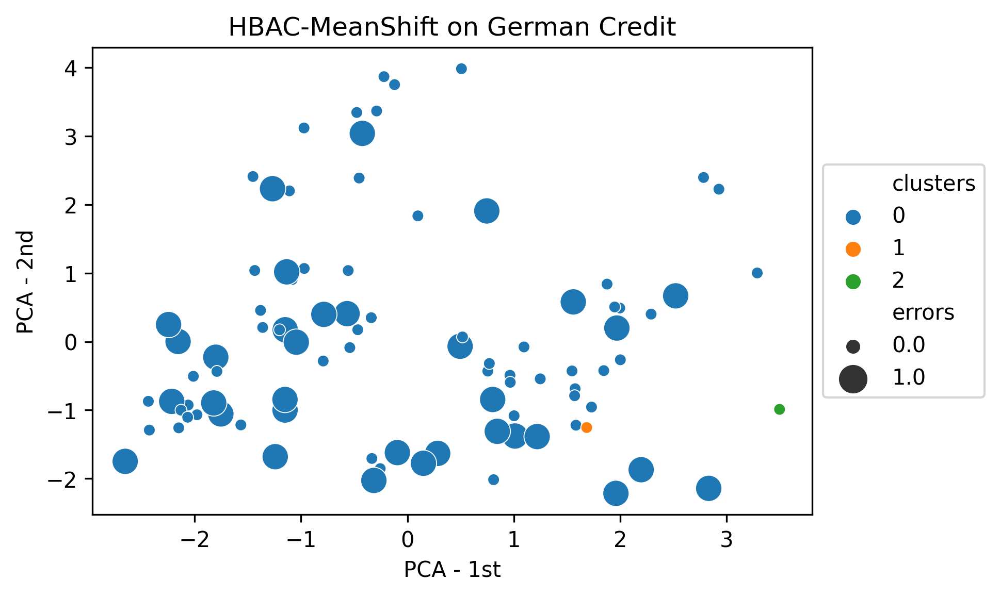

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


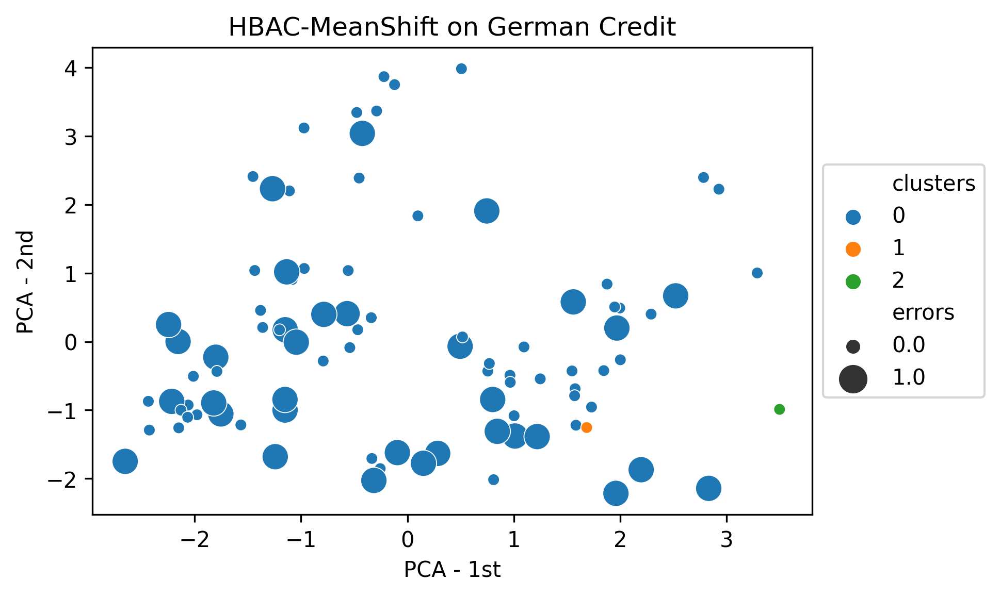

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


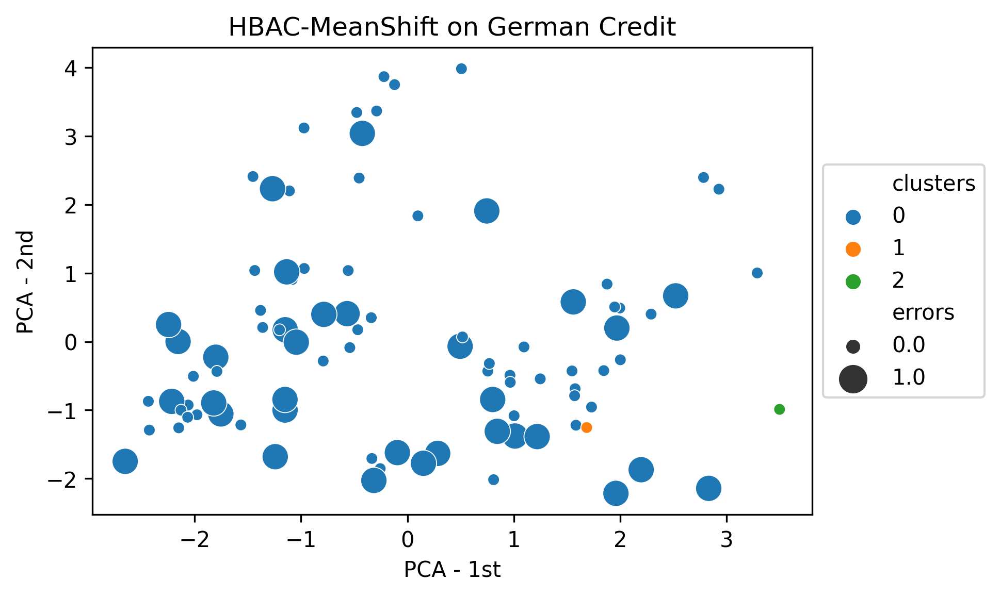

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


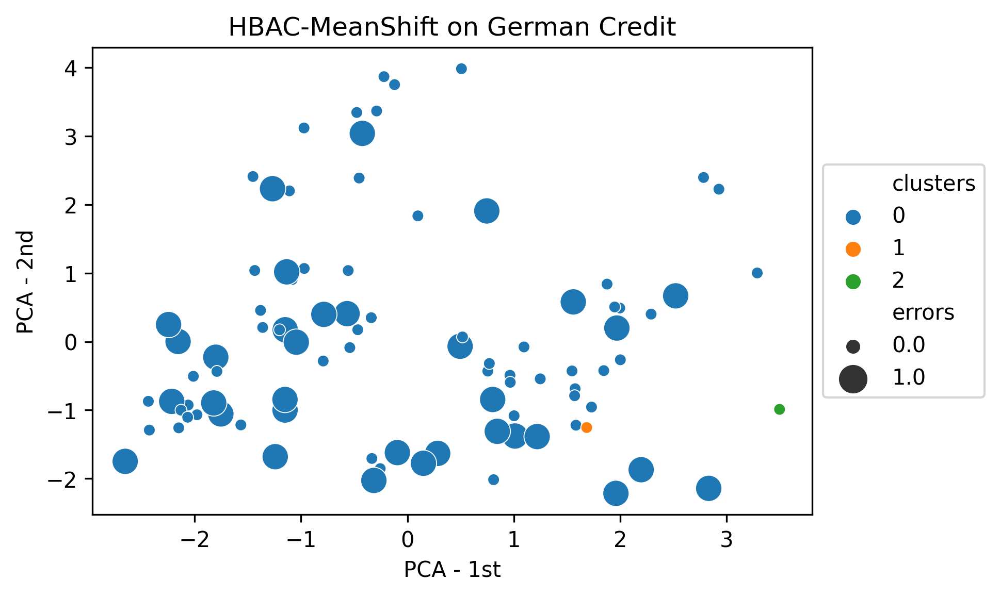

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


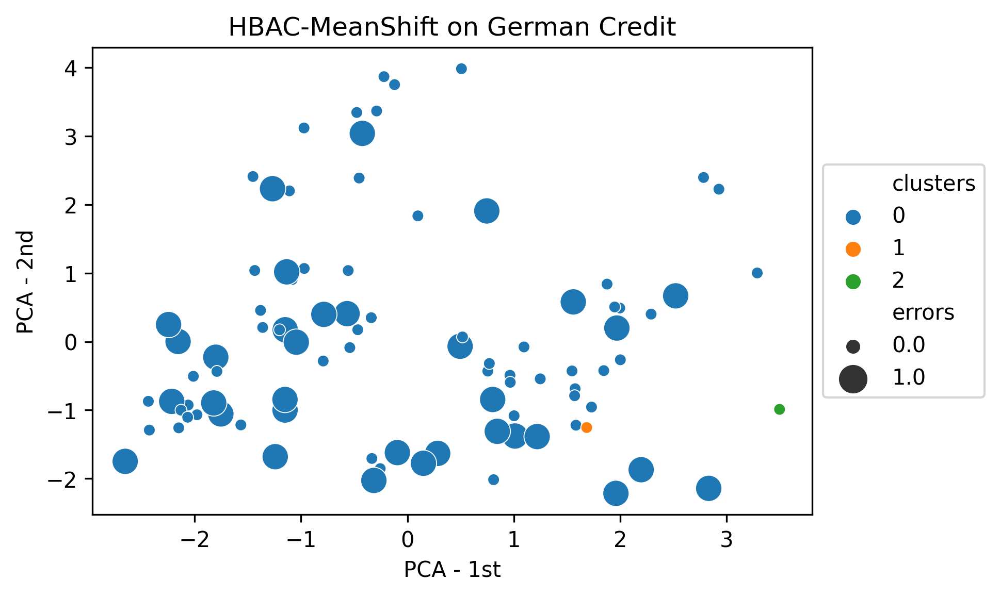

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


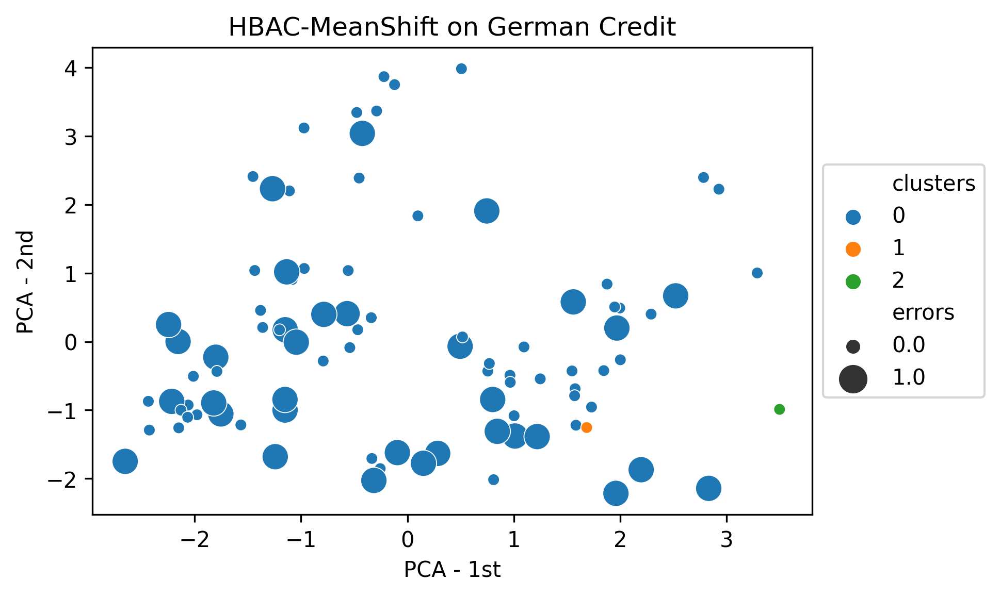

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


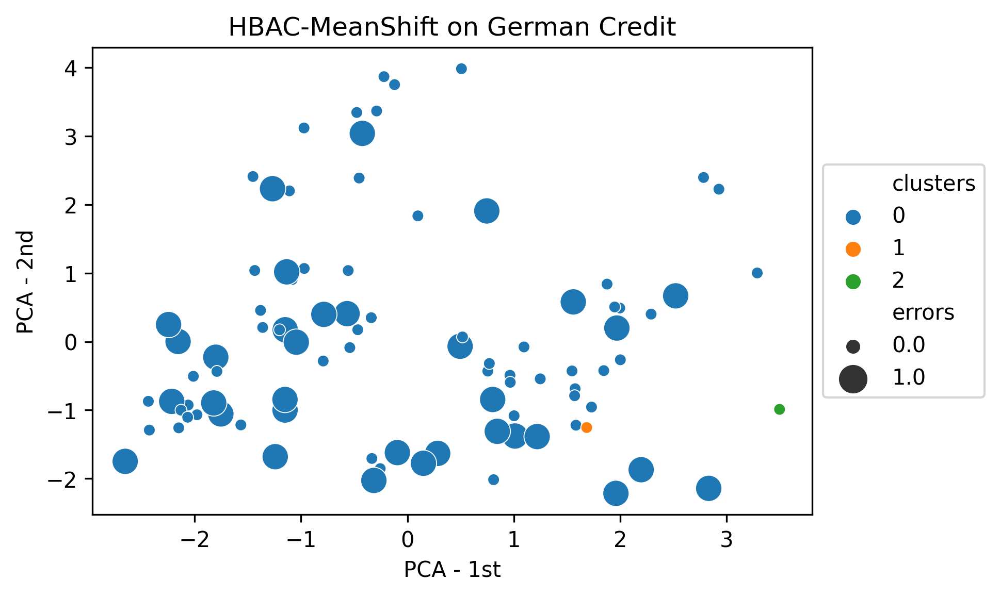

--> Cluster with the highest variance: 0
This is the current cluster:  0
smallest cluster: 90


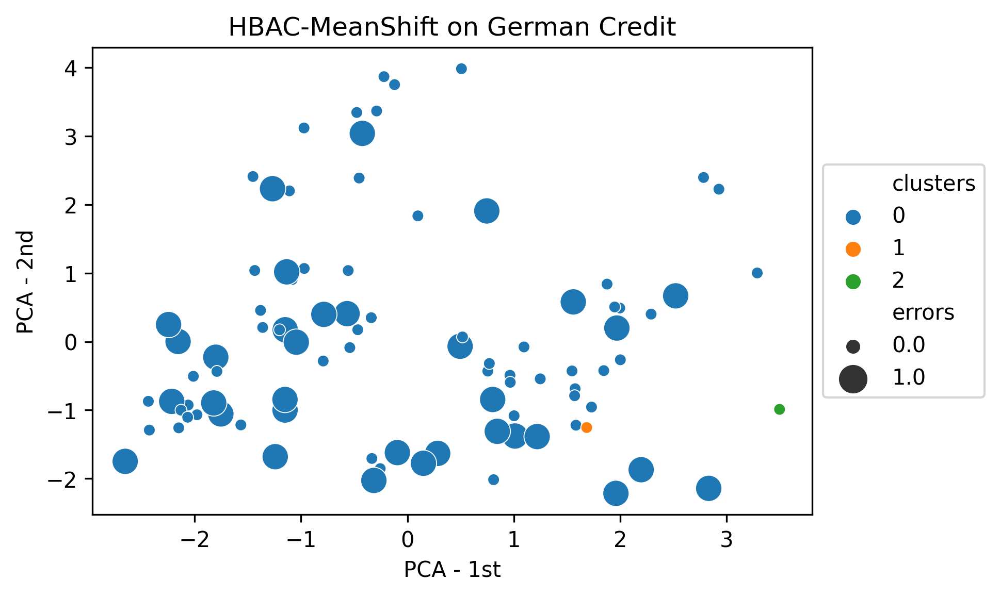

--> Cluster with the highest variance: 0
MAX_ITER
[0.13150585678058208, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539, 0.1181965260353539]


In [170]:
MAX_ITER = 30
x = 0 # cluster number
initial_bias = 0
bw1 = 8
# bw1 = estimate_bandwidth(bandwidth_features)
# print('estimated bandwidth: ', bw1)
pca_plot(full_data)
variance_list = []
average_accuracy = accuracy(full_data) 
minimal_splittable_cluster_size = round(0.03 * len(full_data))
minimal_acceptable_cluster_size = round(0.01 * len(full_data))
print("average_accuracy is: ", average_accuracy) 


for i in range(1, MAX_ITER):
    print('This is the current cluster: ', x)
    if len(full_data['clusters'].unique()) != 1:
        variance_list.append(calculate_variance(full_data))

    full_data['new_clusters'] = -1
    candidate_cluster = full_data.loc[full_data['clusters'] == x] 

    if len(candidate_cluster) < minimal_splittable_cluster_size:
        x = get_random_cluster(full_data['clusters'])
        continue
    
    # Apply MeanShift
    candidate_cluster['new_clusters'] = pd.DataFrame(MeanShift(bandwidth=bw1).fit_predict(candidate_cluster.drop(['clusters', 'new_clusters', 'predicted_class','true_class', 'errors'], axis=1)), index=candidate_cluster.index)

    full_data['new_clusters'] = candidate_cluster['new_clusters'].combine_first(full_data['new_clusters']) 

    max_neg_bias = get_max_negative_bias(full_data) 
    min_new_size = get_min_cluster_size(full_data)

    print("smallest cluster:", min_new_size)
    if (max_neg_bias <= initial_bias) & (min_new_size >= minimal_acceptable_cluster_size): 
        # Add new cluster
        n_cluster = max(full_data['clusters'])
        full_data['clusters'][full_data['new_clusters'] == 1] =  n_cluster + 1
        
        pca_plot(full_data)
        x = get_next_cluster(full_data)
        initial_bias = max_neg_bias
    else:
        x = get_random_cluster(full_data['clusters'])
        
print('MAX_ITER')
print(variance_list)